# Выпускная квалификационная работа
# МГТУ им. Н. Э. Баумана
## Прогнозирование конечных свойств новых материалов (композиционных материалов). 
## Головизнин А.И.

Импорт необходимых библиотек

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy.stats as stats
import seaborn as sns

from keras import Sequential
from keras.layers import Dense, Input, Dropout

from sklearn.model_selection import train_test_split, cross_val_score, cross_validate, GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, mean_squared_error, mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.pipeline import make_pipeline

sns.set(style="darkgrid")

2023-04-19 15:17:18.122230: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-04-19 15:17:19.311388: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [2]:
import tensorflow as tf

print(f"Tensorflow version: {tf.__version__}")

Tensorflow version: 2.12.0


Загрузка предоставленного датасета

In [3]:
X_bp = pd.read_excel("data/X_bp.xlsx", index_col=0)
X_nup = pd.read_excel("data/X_nup.xlsx", index_col=0)

Рассмотрим 3 первые строки представненных данных

In [4]:
X_bp.head(3)

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0,1.857143,2030.0,738.736842,30.0,22.267857,100.000000,210.0,70.0,3000.0,220.0
1,1.857143,2030.0,738.736842,50.0,23.750000,284.615385,210.0,70.0,3000.0,220.0
2,1.857143,2030.0,738.736842,49.9,33.000000,284.615385,210.0,70.0,3000.0,220.0


In [5]:
X_bp.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1023 entries, 0 to 1022
Data columns (total 10 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
dtypes: float64(10)
memory usage: 87.9 KB


In [6]:
X_nup.head(3)

,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0,4.0,57.0
1,0,4.0,60.0
2,0,4.0,70.0


In [7]:
X_nup.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1040 entries, 0 to 1039
Data columns (total 3 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Угол нашивки, град  1040 non-null   int64  
 1   Шаг нашивки         1040 non-null   float64
 2   Плотность нашивки   1040 non-null   float64
dtypes: float64(2), int64(1)
memory usage: 32.5 KB


Обьеденим данные методом "inner"

In [8]:
dataf = X_bp.join(X_nup, how="inner")

In [9]:
dataf.head(10)

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0,4.0,57.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,70.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0
5,2.767918,2000.0,748.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,60.0
6,2.569620,1910.0,807.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,70.0
7,2.561475,1900.0,535.000000,111.86,22.267857,284.615385,380.0,75.0,1800.0,120.0,0,7.0,47.0
8,3.557018,1930.0,889.000000,129.00,21.250000,300.000000,380.0,75.0,1800.0,120.0,0,7.0,57.0
9,3.532338,2100.0,1421.000000,129.00,21.250000,300.000000,1010.0,78.0,2000.0,300.0,0,7.0,60.0


Рассмотрим датасет на пропуски

In [10]:
dataf.isnull().sum()

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64

Пропусков нет.

Рассмотрим типы данных столбцов датасета

In [11]:
dataf.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1023 entries, 0 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
 10  Угол нашивки, град                    1023 non-null   int64  
 11  Шаг нашивки      

Всего 1023 строк, 13 признаков.

Все данные имеют численный тип.

Признак 'Угол нашивки, град' имеет целочисленный тип остальные - вещественный.

Рассмотрим количество уникальных значений.

In [12]:
dataf.nunique()

Соотношение матрица-наполнитель         1014
Плотность, кг/м3                        1013
модуль упругости, ГПа                   1020
Количество отвердителя, м.%             1005
Содержание эпоксидных групп,%_2         1004
Температура вспышки, С_2                1003
Поверхностная плотность, г/м2           1004
Модуль упругости при растяжении, ГПа    1004
Прочность при растяжении, МПа           1004
Потребление смолы, г/м2                 1003
Угол нашивки, град                         2
Шаг нашивки                              989
Плотность нашивки                        988
dtype: int64

In [13]:
dataf.columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки'],
      dtype='object')

Максимальное количество уникальных элементов 1014  в признаке `'Соотношение матрица-наполнитель'`.

Признак `'Угол нашивки, град'` содержит 2 уникальных значения и его можно рассмотреть, как категориальный.

Признаки `'Содержание эпоксидных групп,%_2'`, `'Поверхностная плотность, г/м2'`, `'Модуль упругости при растяжении, ГПа'`, `'Прочность при растяжении, МПа'` содержит одинаковое количество уникальных значений.

Рассмотрим эти признаки.

In [14]:
from IPython.display import display
from ipywidgets import FloatSlider, Dropdown, interact

In [15]:
@interact
def show_value_counts(column = dataf.columns):
    return dataf[column].value_counts()

interactive(children=(Dropdown(description='column', options=('Соотношение матрица-наполнитель', 'Плотность, к…

In [16]:
dataf['Содержание эпоксидных групп,%_2'].value_counts()

21.250000    12
22.267857     9
25.576630     1
25.050848     1
23.276208     1
             ..
21.132573     1
23.961233     1
21.043501     1
20.646284     1
27.474763     1
Name: Содержание эпоксидных групп,%_2, Length: 1004, dtype: int64

In [17]:
dataf['Прочность при растяжении, МПа'].value_counts()

3000.000000    9
2455.555556    5
2000.000000    5
1800.000000    4
2071.715856    1
              ..
2167.533030    1
2300.777919    1
2363.621230    1
2038.469587    1
2856.328932    1
Name: Прочность при растяжении, МПа, Length: 1004, dtype: int64

In [18]:
dataf['Модуль упругости при растяжении, ГПа'].value_counts()

70.000000    9
73.333333    5
78.000000    5
75.000000    4
74.042708    1
            ..
71.758909    1
76.398875    1
66.522175    1
72.124020    1
74.309704    1
Name: Модуль упругости при растяжении, ГПа, Length: 1004, dtype: int64

Обратим внимание на то что повторяющиеся значения признаков целочисленные. Посмотрим строки признаков с повторяющимися значениями

In [19]:
dataf.loc[(dataf['Потребление смолы, г/м2'] == 220) | (dataf['Потребление смолы, г/м2'] == 120) | (dataf['Потребление смолы, г/м2'] == 300)]

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.000000,3000.000000,220.0,0,4.0,57.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.000000,3000.000000,220.0,0,4.0,60.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.000000,3000.000000,220.0,0,4.0,70.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.000000,3000.000000,220.0,0,5.0,47.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.000000,3000.000000,220.0,0,5.0,57.0
5,2.767918,2000.0,748.000000,111.86,22.267857,284.615385,210.0,70.000000,3000.000000,220.0,0,5.0,60.0
6,2.569620,1910.0,807.000000,111.86,22.267857,284.615385,210.0,70.000000,3000.000000,220.0,0,5.0,70.0
7,2.561475,1900.0,535.000000,111.86,22.267857,284.615385,380.0,75.000000,1800.000000,120.0,0,7.0,47.0
8,3.557018,1930.0,889.000000,129.00,21.250000,300.000000,380.0,75.000000,1800.000000,120.0,0,7.0,57.0
9,3.532338,2100.0,1421.000000,129.00,21.250000,300.000000,1010.0,78.000000,2000.000000,300.0,0,7.0,60.0


Все повторяющиеся признаки находятся в диапазоне с 0 по 22 строку.
Значения признака `Соотношение матрица-наполнитель` в отличии от других повторяющихся значений имеет вещественные значения. Можно предположить, что строки с 0 по 22 синтетические, а признак 'Соотношение матрица-наполнитель' спрогнозирован моделью машинного обучения.

In [20]:
dataf.iloc[20:26]

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
20,2.877358,2000.000000,205.000000,111.860000,22.267857,284.615385,1010.000000,78.000000,2000.000000,300.000000,90,4.0,47.0
21,1.598174,1920.000000,456.000000,111.860000,22.267857,284.615385,470.000000,73.333333,2455.555556,220.000000,90,4.0,57.0
22,4.029126,1880.000000,622.000000,111.860000,22.267857,284.615385,470.000000,73.333333,2455.555556,220.000000,90,4.0,60.0
23,2.587348,1953.274926,1136.596135,137.627420,22.344534,234.716883,555.893453,80.803222,2587.342983,246.613117,90,4.0,70.0
24,2.499918,1942.595777,901.519947,146.252208,23.081757,351.231874,864.725484,76.178075,3705.672523,226.222760,90,5.0,47.0
25,2.046471,2037.631811,707.570887,101.617251,23.146393,312.307205,547.601219,73.817067,2624.026407,178.198556,90,5.0,57.0


Так как строк с повторяющимися признаками не так много, считаю что их можно удалить

In [21]:
dataf_clear = dataf[23:]

In [22]:
dataf_clear.head(5)

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
23,2.587348,1953.274926,1136.596135,137.627420,22.344534,234.716883,555.893453,80.803222,2587.342983,246.613117,90,4.0,70.0
24,2.499918,1942.595777,901.519947,146.252208,23.081757,351.231874,864.725484,76.178075,3705.672523,226.222760,90,5.0,47.0
25,2.046471,2037.631811,707.570887,101.617251,23.146393,312.307205,547.601219,73.817067,2624.026407,178.198556,90,5.0,57.0
26,1.856476,2018.220332,836.294382,135.401697,26.435515,327.510377,150.961449,77.210762,2473.187195,123.344561,90,5.0,60.0
27,3.305535,1917.907506,478.286247,105.786930,17.874100,328.154579,526.692159,72.345709,3059.032991,275.575880,90,5.0,70.0


In [23]:
dataf_clear.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1000 entries, 23 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1000 non-null   float64
 1   Плотность, кг/м3                      1000 non-null   float64
 2   модуль упругости, ГПа                 1000 non-null   float64
 3   Количество отвердителя, м.%           1000 non-null   float64
 4   Содержание эпоксидных групп,%_2       1000 non-null   float64
 5   Температура вспышки, С_2              1000 non-null   float64
 6   Поверхностная плотность, г/м2         1000 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1000 non-null   float64
 8   Прочность при растяжении, МПа         1000 non-null   float64
 9   Потребление смолы, г/м2               1000 non-null   float64
 10  Угол нашивки, град                    1000 non-null   int64  
 11  Шаг нашивки     

In [24]:
dataf_clear.nunique()

Соотношение матрица-наполнитель         1000
Плотность, кг/м3                        1000
модуль упругости, ГПа                   1000
Количество отвердителя, м.%             1000
Содержание эпоксидных групп,%_2         1000
Температура вспышки, С_2                1000
Поверхностная плотность, г/м2           1000
Модуль упругости при растяжении, ГПа    1000
Прочность при растяжении, МПа           1000
Потребление смолы, г/м2                 1000
Угол нашивки, град                         2
Шаг нашивки                              988
Плотность нашивки                        987
dtype: int64

In [25]:
dataf_clear['Плотность нашивки'].value_counts()

70.000000    5
57.000000    4
60.000000    4
47.000000    4
62.512064    1
            ..
43.709842    1
70.922716    1
70.169846    1
63.078186    1
77.434468    1
Name: Плотность нашивки, Length: 987, dtype: int64

In [26]:
dataf_clear.loc[(dataf_clear['Плотность нашивки'] == 70.) | (dataf_clear['Плотность нашивки'] == 57.) | (dataf_clear['Плотность нашивки'] == 60.) | (dataf_clear['Плотность нашивки'] == 47.)]

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
23,2.587348,1953.274926,1136.596135,137.627420,22.344534,234.716883,555.893453,80.803222,2587.342983,246.613117,90,4.0,70.0
24,2.499918,1942.595777,901.519947,146.252208,23.081757,351.231874,864.725484,76.178075,3705.672523,226.222760,90,5.0,47.0
25,2.046471,2037.631811,707.570887,101.617251,23.146393,312.307205,547.601219,73.817067,2624.026407,178.198556,90,5.0,57.0
26,1.856476,2018.220332,836.294382,135.401697,26.435515,327.510377,150.961449,77.210762,2473.187195,123.344561,90,5.0,60.0
27,3.305535,1917.907506,478.286247,105.786930,17.874100,328.154579,526.692159,72.345709,3059.032991,275.575880,90,5.0,70.0
28,2.709554,1892.071124,641.052549,96.563293,22.989291,262.956722,804.592621,74.511359,2288.967377,126.816339,90,7.0,47.0
29,2.282825,2008.357592,393.967325,149.372832,21.661751,330.498641,535.371459,72.244924,2704.445081,261.077072,90,7.0,57.0
30,1.978140,1973.629097,991.724095,149.372128,19.750578,232.058191,485.453778,75.665701,2448.943079,162.493694,90,7.0,60.0
31,1.771436,1872.491560,801.033883,79.794548,22.296304,340.736898,864.929184,70.947592,2796.785402,123.356264,90,7.0,70.0
32,3.277087,2010.047012,339.550423,67.498993,24.280609,254.949084,117.535234,67.478707,2462.605386,207.018581,90,9.0,47.0


In [27]:
dataf_clear = dataf[40:]

In [28]:
dataf_clear.head(5)

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
40,3.034399,1968.401388,455.871019,61.421297,23.490723,316.414572,637.376893,75.090372,2848.490078,311.052398,0,7.856167,64.301964
41,2.465205,1936.099137,1056.554985,71.294058,24.523381,271.975678,129.077163,66.420794,2868.586527,227.022557,0,7.401543,19.250533
42,2.664389,1996.159145,525.057774,77.506883,18.126107,223.408685,28.658102,69.489773,2220.587445,314.776669,0,6.675780,78.623299
43,1.193530,1965.929227,899.603701,102.959069,19.566716,225.810223,871.088955,73.454695,2335.541792,91.047646,0,7.526398,38.176975
44,2.914333,2049.373404,382.263359,81.352047,16.391595,233.296063,561.992131,69.814615,2262.784366,303.075452,0,8.325699,46.045428


In [29]:
dataf_clear.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 983 entries, 40 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       983 non-null    float64
 1   Плотность, кг/м3                      983 non-null    float64
 2   модуль упругости, ГПа                 983 non-null    float64
 3   Количество отвердителя, м.%           983 non-null    float64
 4   Содержание эпоксидных групп,%_2       983 non-null    float64
 5   Температура вспышки, С_2              983 non-null    float64
 6   Поверхностная плотность, г/м2         983 non-null    float64
 7   Модуль упругости при растяжении, ГПа  983 non-null    float64
 8   Прочность при растяжении, МПа         983 non-null    float64
 9   Потребление смолы, г/м2               983 non-null    float64
 10  Угол нашивки, град                    983 non-null    int64  
 11  Шаг нашивки      

In [30]:
dataf_clear.nunique()

Соотношение матрица-наполнитель         983
Плотность, кг/м3                        983
модуль упругости, ГПа                   983
Количество отвердителя, м.%             983
Содержание эпоксидных групп,%_2         983
Температура вспышки, С_2                983
Поверхностная плотность, г/м2           983
Модуль упругости при растяжении, ГПа    983
Прочность при растяжении, МПа           983
Потребление смолы, г/м2                 983
Угол нашивки, град                        2
Шаг нашивки                             983
Плотность нашивки                       983
dtype: int64

Рассмотрим описание датасета

In [31]:
dataf_clear.describe().T

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,983.0,2.934399,0.915942,0.389403,2.319244,2.913953,3.562274,5.591742
"Плотность, кг/м3",983.0,1975.975965,73.764303,1731.764635,1925.400035,1977.661795,2021.277591,2207.773481
"модуль упругости, ГПа",983.0,737.744541,329.630145,2.436909,497.868982,738.957167,962.207163,1911.536477
"Количество отвердителя, м.%",983.0,110.492719,28.301270,17.740275,92.112353,110.099044,129.884490,198.953207
"Содержание эпоксидных групп,%_2",983.0,22.229921,2.411140,14.254985,20.553656,22.208465,23.981267,28.955094
"Температура вспышки, С_2",983.0,285.664381,40.963392,160.255843,258.402421,285.407901,313.061676,413.273418
"Поверхностная плотность, г/м2",983.0,482.194609,281.687097,0.603740,267.144172,451.309770,694.336817,1399.542362
"Модуль упругости при растяжении, ГПа",983.0,73.322878,3.119536,64.054061,71.287231,73.241464,75.356612,82.682051
"Прочность при растяжении, МПа",983.0,2464.779116,484.963349,1036.856605,2136.596566,2456.395009,2759.083778,3848.436732
"Потребление смолы, г/м2",983.0,218.681742,59.943101,33.803026,179.627520,217.481262,257.632055,414.590628


Рассмотрим парный график всех признаков оригинальных и очищеных данных

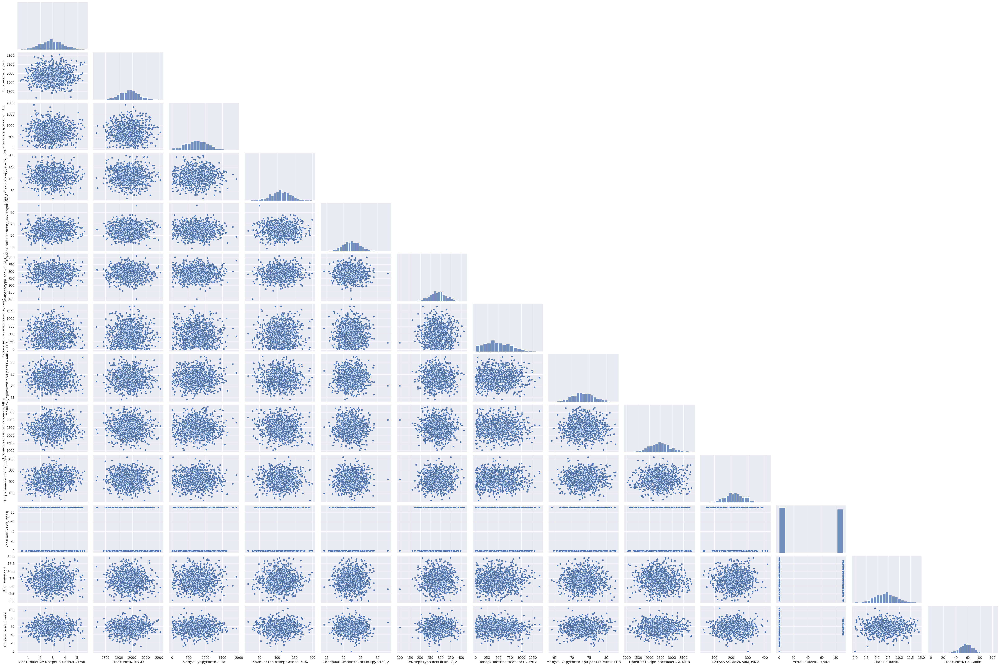

In [32]:
sns.pairplot(data=dataf, aspect=1.5, corner=True)
plt.show()

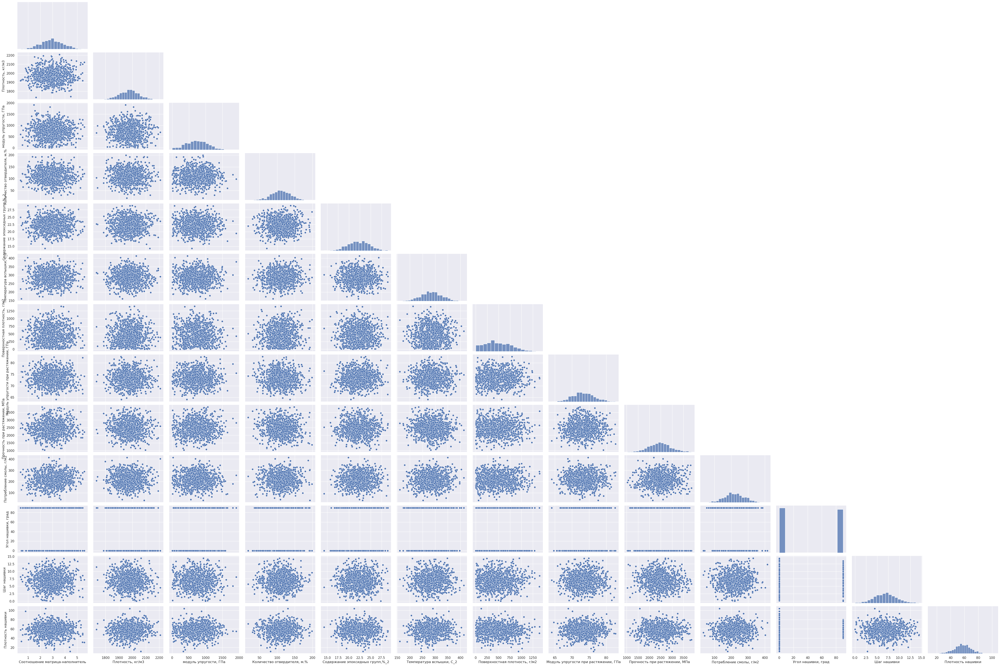

In [33]:
sns.pairplot(data=dataf_clear, aspect=1.5, corner=True)
plt.show()

In [36]:
@interact
def show_scatterplot(X = dataf.columns, Y = dataf.columns):
    fig, axes = plt.subplots(1, 2)
    sns.scatterplot(data=data_all, x=X, y=Y, ax=axes[0], hue=[True if x < 40 else False for x in range(len(data_all))])
    axes[0].set_title("Оригинал")
    sns.scatterplot(data=dataf, x=X, y=Y, ax=axes[1])
    axes[1].set_ylabel("")
    axes[1].set_title("Очищенные даные")

interactive(children=(Dropdown(description='X', options=('Соотношение матрица-наполнитель', 'Плотность, кг/м3'…

Как видно на графике в отчищенных данных отсутствуют некоторые выбросы.

В бальнейшем буду работать с отчищеными данными.

In [34]:
dataf, data_all = dataf_clear, dataf

In [35]:
dataf.head(4)

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
40,3.034399,1968.401388,455.871019,61.421297,23.490723,316.414572,637.376893,75.090372,2848.490078,311.052398,0,7.856167,64.301964
41,2.465205,1936.099137,1056.554985,71.294058,24.523381,271.975678,129.077163,66.420794,2868.586527,227.022557,0,7.401543,19.250533
42,2.664389,1996.159145,525.057774,77.506883,18.126107,223.408685,28.658102,69.489773,2220.587445,314.776669,0,6.675780,78.623299
43,1.193530,1965.929227,899.603701,102.959069,19.566716,225.810223,871.088955,73.454695,2335.541792,91.047646,0,7.526398,38.176975


Признак 'Угол нашивки, град' содержит только 2 значения (0 и 90) и его можно закодировать в категориальный тип

In [39]:
# dataf = pd.get_dummies(dataf, columns=["Угол нашивки, град"])
# dataf.sample(4)

Рассмотрим корреляции признаков

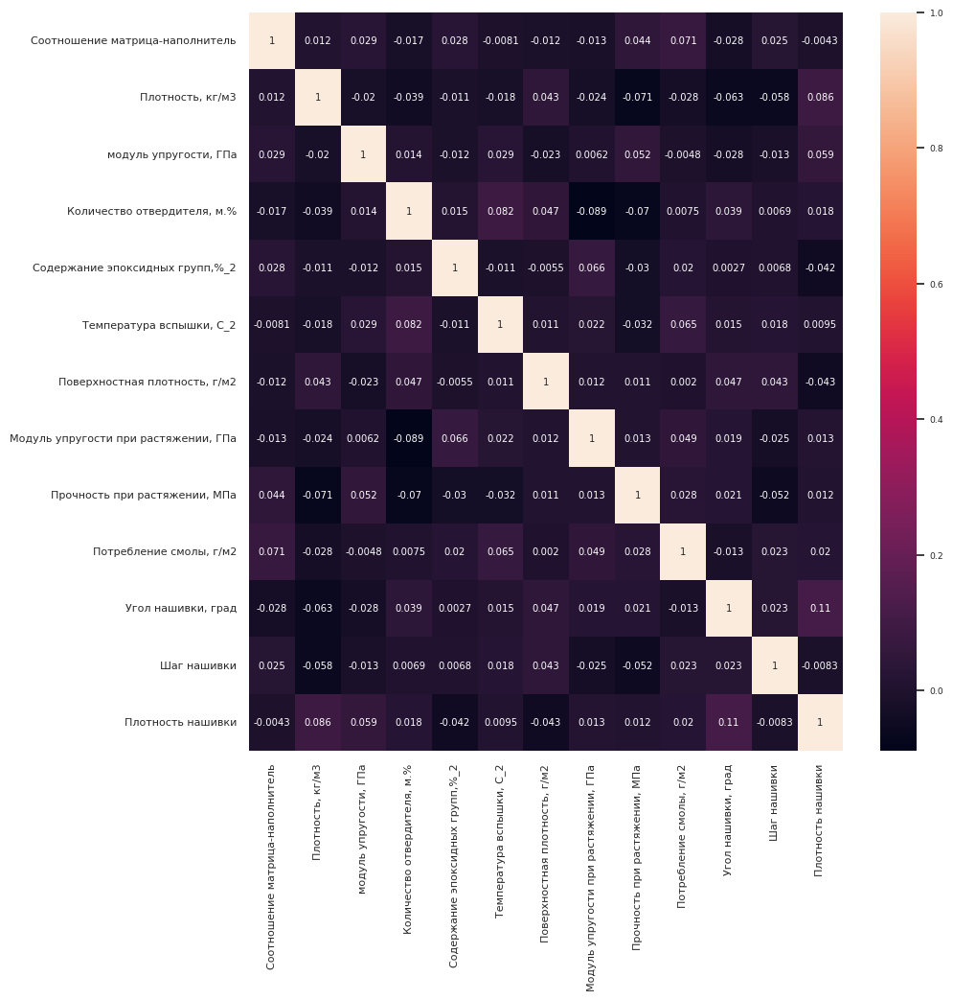

In [37]:
plt.figure(figsize=(10, 10))
sns.set(font_scale=0.6)
sns.heatmap(dataf.corr(), annot=True)
plt.tick_params(axis="both", which="major", labelsize=8)

Значимых корреляций нет

In [38]:
dataf.corr().iloc[0]

Соотношение матрица-наполнитель         1.000000
Плотность, кг/м3                        0.012184
модуль упругости, ГПа                   0.029287
Количество отвердителя, м.%            -0.016912
Содержание эпоксидных групп,%_2         0.027601
Температура вспышки, С_2               -0.008062
Поверхностная плотность, г/м2          -0.011866
Модуль упругости при растяжении, ГПа   -0.012954
Прочность при растяжении, МПа           0.043728
Потребление смолы, г/м2                 0.071472
Угол нашивки, град                     -0.027670
Шаг нашивки                             0.024937
Плотность нашивки                      -0.004332
Name: Соотношение матрица-наполнитель, dtype: float64

Выделим название колонок

In [39]:
columns = dataf.columns

In [40]:
columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки'],
      dtype='object')

Выделим названия целевых признаков

In [41]:
y_col_ratio, y_col_elasticity, y_col_strength = columns[0], columns[7], columns[8]

In [42]:
print(y_col_ratio, y_col_elasticity, y_col_strength)

Соотношение матрица-наполнитель Модуль упругости при растяжении, ГПа Прочность при растяжении, МПа


Выделим колонки категориального признака "Угол нашивки, град"

In [43]:
X_col_category = columns[10]

In [44]:
X_col_category

'Угол нашивки, град'

In [45]:
X_col_no_category = columns.drop(X_col_category)

In [46]:
X_col_no_category

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Шаг нашивки', 'Плотность нашивки'],
      dtype='object')

In [47]:
X_col_ratio = columns.drop([y_col_ratio])
X_col_elasticity = columns.drop(y_col_elasticity)
X_col_strength = columns.drop(y_col_strength)

Рассмотрим распределение каждого признака по отдельности

## Кластеризация данных и PCA

Для поиска закономерностей в данных используем метод снижения размерности PCA

In [48]:
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN, OPTICS, AffinityPropagation
from scipy.cluster import hierarchy 
from scipy.spatial import distance_matrix 
from sklearn import decomposition
from sklearn.metrics import silhouette_score
from sklearn.mixture import GaussianMixture

In [49]:
pca = decomposition.PCA()
data_pca = pca.fit_transform(dataf)

In [50]:
component_names = [f"PC{i+1}" for i in range(data_pca.shape[1])]

In [51]:
data_pca = pd.DataFrame(data_pca, columns=component_names)
# В loading записываем "смысловую нагрузку" компонент, их корреляцию с исходными
loadings = pd.DataFrame(
    pca.components_.T,
    columns=component_names,
    index=columns,
    )

In [52]:
print(loadings)

                                           PC1       PC2       PC3       PC4  \
Соотношение матрица-наполнитель      -0.000085  0.000072 -0.000033 -0.000173   
Плотность, кг/м3                      0.011068 -0.003702  0.012116 -0.995480   
модуль упругости, ГПа                -0.065643  0.994792  0.077640 -0.003229   
Количество отвердителя, м.%           0.004031  0.001535  0.005086  0.021758   
Содержание эпоксидных групп,%_2       0.000150 -0.000065 -0.000051  0.000481   
Температура вспышки, С_2              0.002625  0.003983  0.002097  0.020029   
Поверхностная плотность, г/м2        -0.008213 -0.078276  0.996779  0.011577   
Модуль упругости при растяжении, ГПа -0.000083  0.000040  0.000138  0.001103   
Прочность при растяжении, МПа        -0.997729 -0.064817 -0.013166 -0.011110   
Потребление смолы, г/м2              -0.003456 -0.001417  0.000193  0.062489   
Угол нашивки, град                   -0.001856 -0.004538  0.007126  0.061288   
Шаг нашивки                           0.

Дисперсия каждого нового признака PCA более чем на 98% зависит от дисперсииодного из изначальных признаков. Из этого следует что уменьшение размерности на 1 с помощью PCA равноценно откидыванию оригинального признака

Расмотрим разбиение нормализованых данных на кластеры методом k-means.
Этод метод разобьет данные на кластеры близких по евклидову расстоянию векторов. По признаку данные 'Угол нашивки, град' данные однозначно разбивается на 2 кластера по этому исключим данный признак.

In [53]:
km2 = KMeans(n_clusters=2)
km3 = KMeans(n_clusters=3)
km4 = KMeans(n_clusters=4)
km5 = KMeans(n_clusters=5)
km6 = KMeans(n_clusters=6)

minmax_scaler = MinMaxScaler()
dataf_minmax = pd.DataFrame(minmax_scaler.fit_transform(data_all), columns=columns)

km2.fit(dataf_minmax[X_col_no_category])
km3.fit(dataf_minmax[X_col_no_category])
km4.fit(dataf_minmax[X_col_no_category])
km5.fit(dataf_minmax[X_col_no_category])
km6.fit(dataf_minmax[X_col_no_category])

/home/sargon/miniconda3/envs/rapids/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/sargon/miniconda3/envs/rapids/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/sargon/miniconda3/envs/rapids/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/sargon/miniconda3/envs/rapids/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppre

KMeans(n_clusters=6)

Визуализировать будем не стандартизированые данные разбитые на кластеры

In [54]:
@interact
def show_k_means(column_1=dataf.columns, column_2=dataf.columns, km=[km2, km3, km4, km5, km6]):
    sns.scatterplot(x=data_all[column_1], y=data_all[column_2], hue=km.labels_, palette="deep")
    plt.title('KMeans')
    plt.show()

interactive(children=(Dropdown(description='column_1', options=('Соотношение матрица-наполнитель', 'Плотность,…

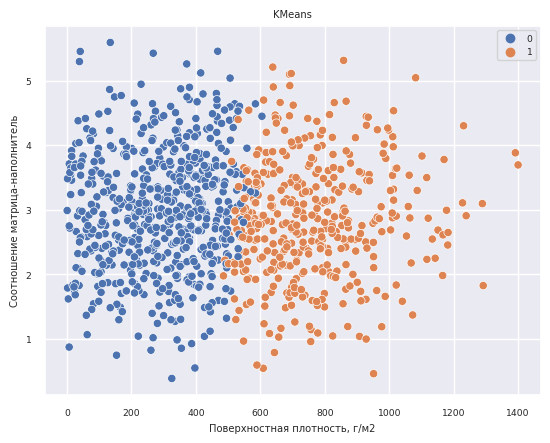

In [56]:
sns.scatterplot(x=data_all['Поверхностная плотность, г/м2'], y=data_all['Соотношение матрица-наполнитель'], hue=km2.labels_, palette="deep")
plt.title('KMeans')
plt.show()

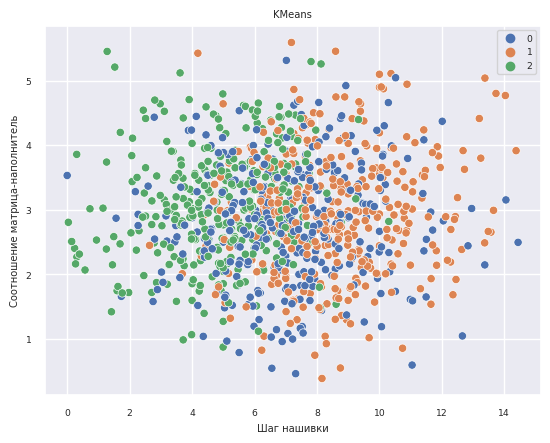

In [57]:
sns.scatterplot(x=data_all['Шаг нашивки'], y=data_all['Соотношение матрица-наполнитель'], hue=km3.labels_, palette="deep")
plt.title('KMeans')
plt.show()

KMeans с 2умя кластерами разбивает данные на 2 кластера по признаку `Поверхностная плотность, г/м2`

KMeans с 3емя кластерами дополнительно разбивает один из кластеров KMeans(2) на 2 кластера по признакам `Шаг нашивки` `Соотношение матрица-наполнитель`

Зависимостей расположения векторов признаков в евклидовом пространстве мне обнаружить не удалось

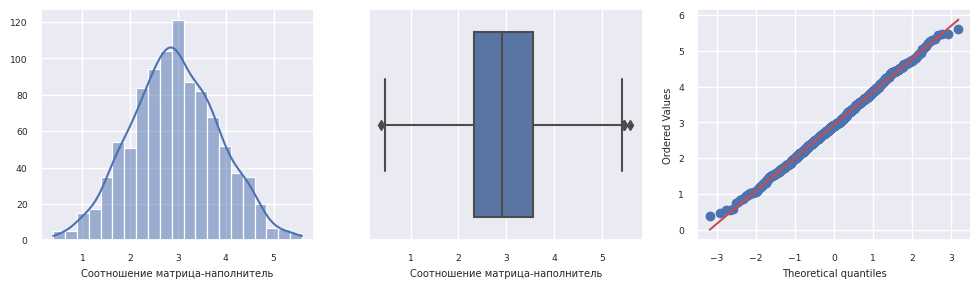

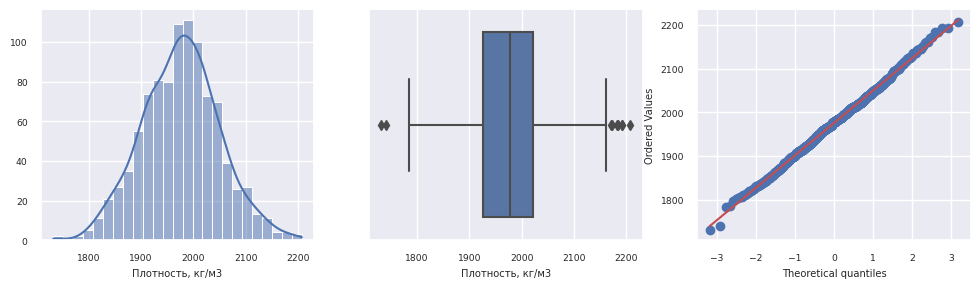

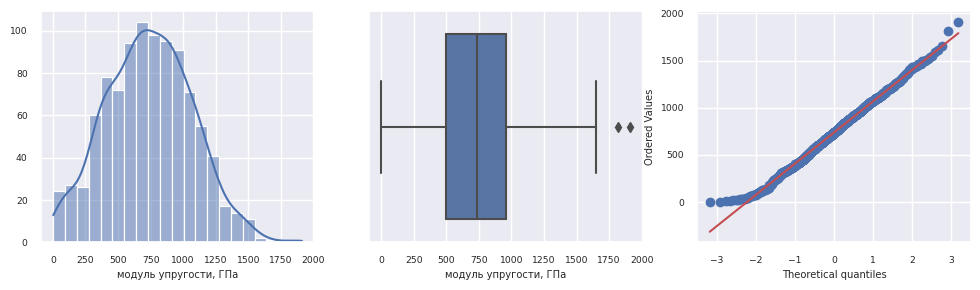

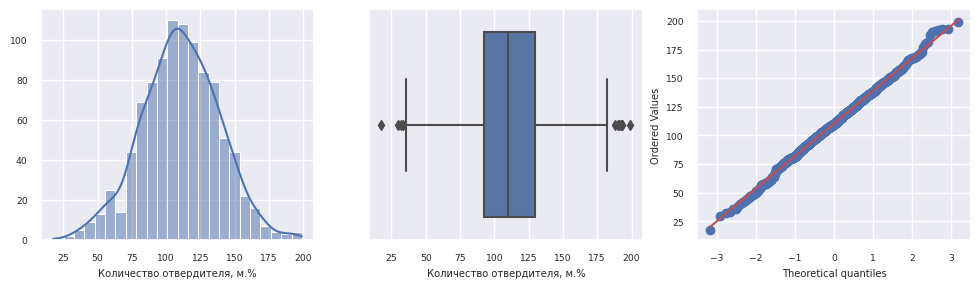

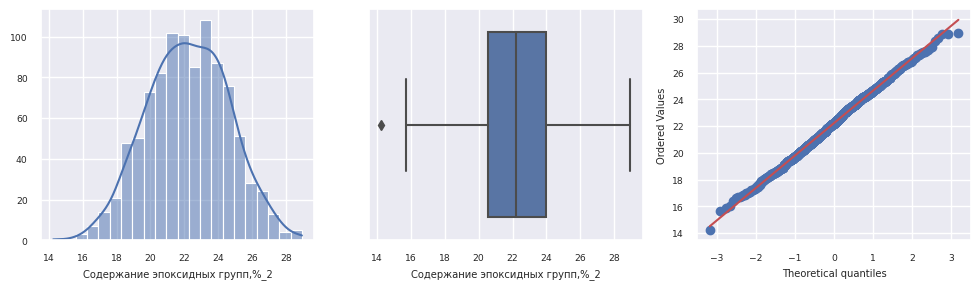

...

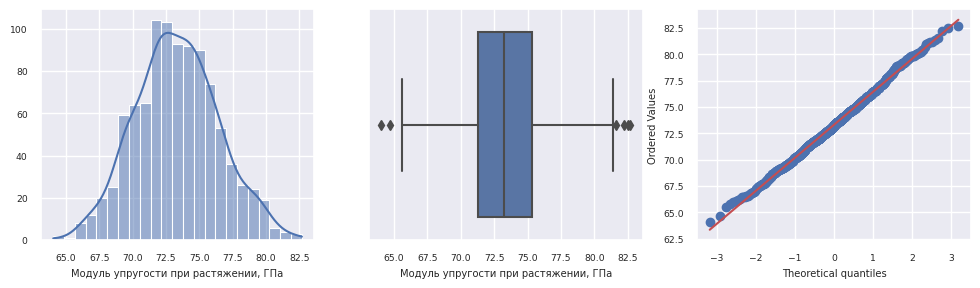

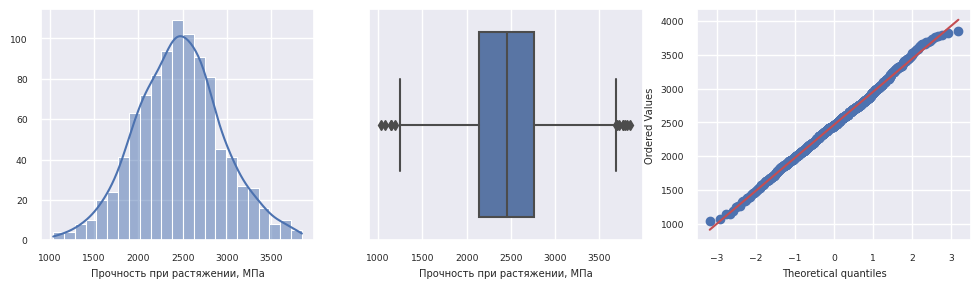

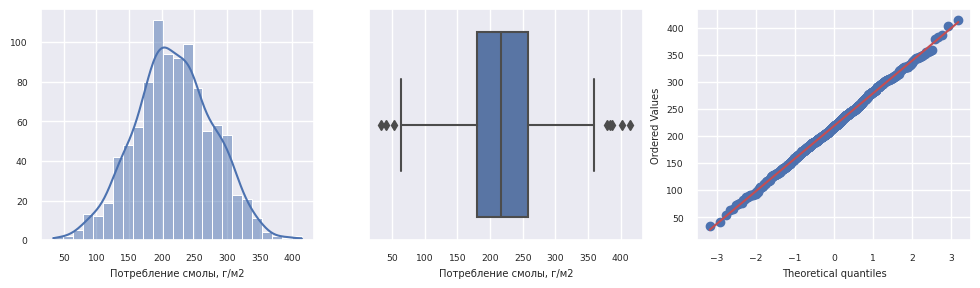

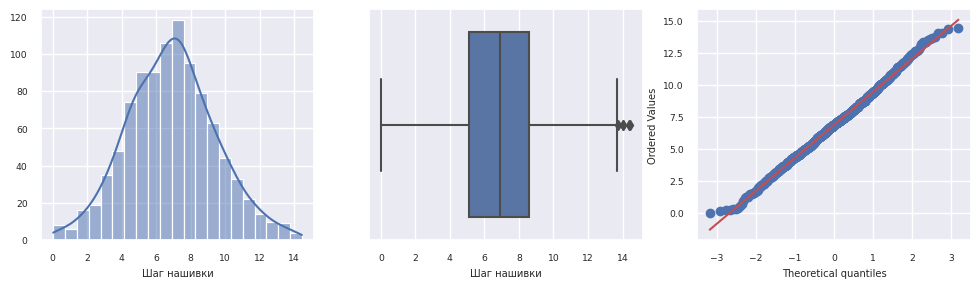

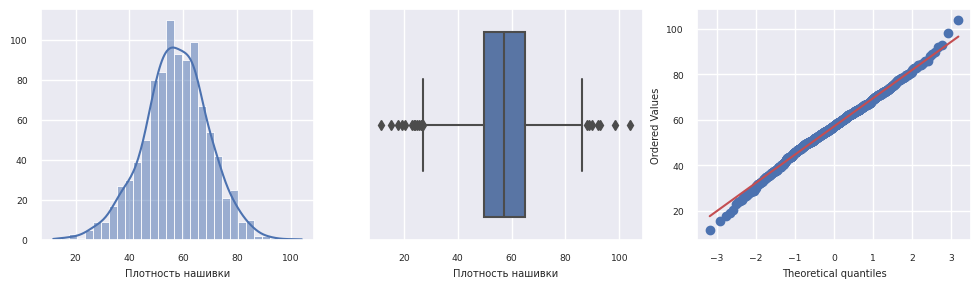

In [58]:

for i, column in enumerate(X_col_no_category):
    fig, axes = plt.subplots(1, 3, figsize=(12, 3))
    sns.histplot(data=dataf, x=column, kde=True, ax=axes[0])
    axes[0].set_ylabel("")
    sns.boxplot(data=dataf, x=column, ax=axes[1])
    stats.probplot(dataf[column], dist="norm", plot=axes[2])
    axes[2].set_title("")
    plt.savefig(str(i) +'.png')
    plt.show()

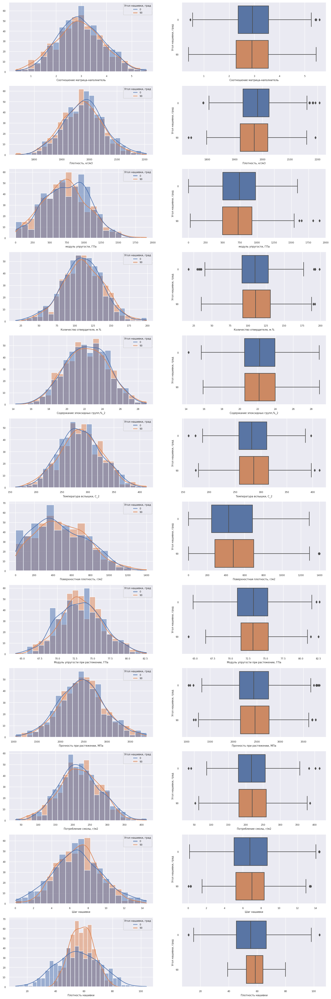

In [59]:
fig, axes = plt.subplots(X_col_no_category.shape[0], 2, figsize=(16, 50))
for i, column in enumerate(X_col_no_category):
    sns.histplot(
        data=dataf,
        x=column,
        kde=True,
        hue=dataf["Угол нашивки, град"].astype("str"),
        ax=axes[i, 0],
    )
    axes[i, 0].set_ylabel("")
    sns.boxplot(
        data=dataf, x=column, y=dataf["Угол нашивки, град"].astype("str"), ax=axes[i, 1]
    )
plt.show()

## Анаиз выбросов

### Межквартильный размах.

Межквартильный размах ($IQR$) — это разница между 75-м процентилем ($Q3$) и 25-м процентилем ($Q14) в наборе данных. Он измеряет разброс средних 50% значений.

Наблюдение определяется как выброс, если оно в 1,5 раза превышает межквартильный размах, превышающий третий квартиль ($Q3$), или в 1,5 раза превышает межквартильный размах, меньше первого квартиля ($Q1$).

Выбросы = наблюдения > $Q3 + 1,5*IQR$ или $Q1 – 1,5*IQR$

### Z-значения.

Z-оценка показывает, сколько стандартных отклонений данного значения от среднего. Мы используем следующую формулу для расчета z-показателя:

$z = (X - μ) / σ$

Где:

$X$ — это одно необработанное значение данных
$μ$ - среднее значение
$σ$ - стандартное отклонение

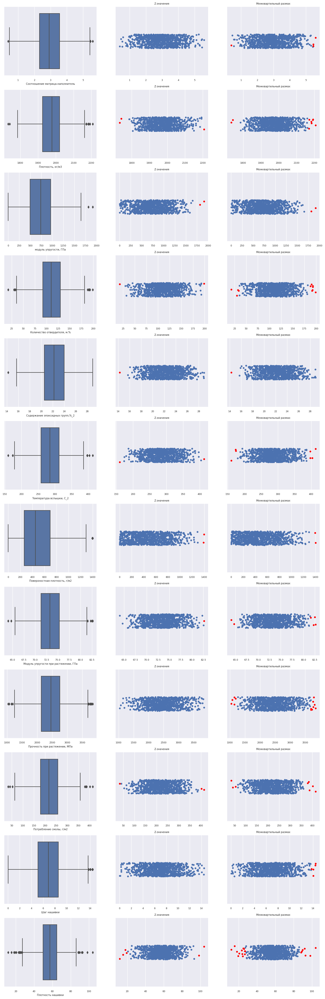

In [60]:
#count_outliners = {"z": 0, "iqr": 0}
outliers_3q_index = []
outliers_iqr_index = []

fig, axes = plt.subplots(X_col_no_category.shape[0], 3, figsize=(16, 50))
for i, column in enumerate(X_col_no_category):
    # Z-значения
    z = np.abs(stats.zscore(dataf[column]))
    outliers_3q = z.index[z >= 3]
    norm_3q = z.index[z < 3]

    #count_outliners["z"] += outliers_3q.size
    outliers_3q_index.extend(outliers_3q.tolist())

    # Межквартильный размах.
    q1 = dataf[column].quantile(0.25)
    q3 = dataf[column].quantile(0.75)
    iqr = q3 - q1
    outliers_iqr = (dataf[column] <= q1 - 1.5 * iqr) | (dataf[column] >= q3 + 1.5 * iqr)
    norm_iqr = outliers_iqr.map({True: False, False: True})
    
    #count_outliners["iqr"] += outliers_iqr.sum()
    outliers_iqr_index.extend(dataf[column].index[outliers_iqr].tolist())

    sns.boxplot(data=dataf, x=column, ax=axes[i, 0])

    sns.stripplot(x=dataf[column][norm_3q], ax=axes[i, 1])
    sns.stripplot(x=dataf[column][outliers_3q], color="red", ax=axes[i, 1])
    axes[i, 1].set(title='Z-значения')
    axes[i, 1].set_xlabel('')
    
    sns.stripplot(x=dataf[column][norm_iqr], ax=axes[i, 2])
    sns.stripplot(x=dataf[column][outliers_iqr], color="red", ax=axes[i, 2])
    axes[i, 2].set(title='Межквартильный размах')
    axes[i, 2].set_xlabel('')

In [61]:
print(f"Всего выбросов:\n  Z-оценка:{len(outliers_3q_index)}\n  Межквартильный размах:{len(outliers_iqr_index)} \n\nИндексы строк выбросов Z-оценка:{set(outliers_3q_index)} \n\nИндексы строк выбросов Межквартильный размах:{set(outliers_iqr_index)}")

Всего выбросов:
  Z-оценка:22
  Межквартильный размах:88 

Индексы строк выбросов Z-оценка:{257, 770, 140, 918, 279, 791, 412, 41, 298, 692, 438, 461, 718, 592, 464, 211, 375, 100, 873, 503, 378} 

Индексы строк выбросов Межквартильный размах:{529, 535, 41, 52, 74, 592, 593, 94, 99, 100, 106, 626, 114, 117, 119, 636, 135, 649, 140, 654, 673, 165, 172, 175, 692, 695, 185, 193, 718, 719, 721, 211, 218, 224, 233, 237, 251, 257, 770, 262, 264, 270, 787, 791, 279, 800, 298, 309, 317, 318, 322, 858, 348, 867, 873, 877, 369, 375, 378, 383, 897, 387, 392, 918, 412, 938, 438, 958, 446, 448, 461, 464, 465, 466, 471, 481, 1000, 495, 496, 499, 503, 505, 508, 511}


Удалим выбросы обнаруженые методом межквартильного размаха

In [64]:
dataf_without_outliners = dataf.drop (index= set(outliers_iqr_index))

In [65]:
dataf_without_outliners.shape

(899, 13)

Рассмотрим целевые признаки

Целевой признак Модуль упругости при растяжении, ГПа
Диапазон значений от 64.05 до 82.68


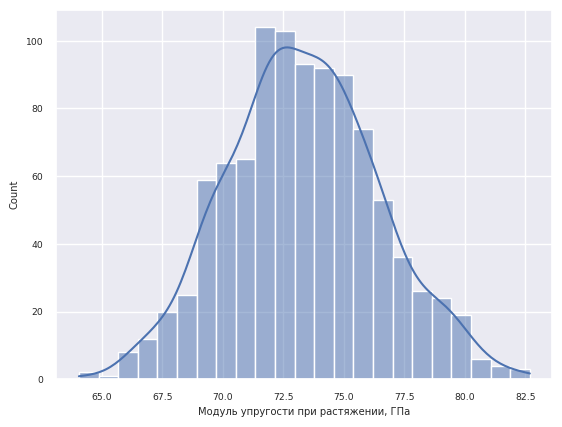

Целевой признак Прочность при растяжении, МПа
Диапазон значений от 1036.86 до 3848.44


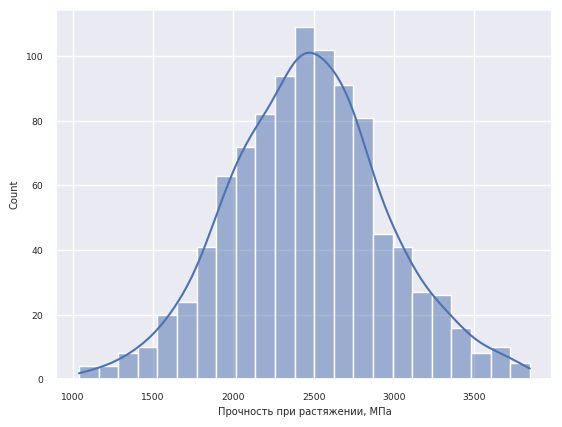

Целевой признак Соотношение матрица-наполнитель
Диапазон значений от 0.39 до 5.59


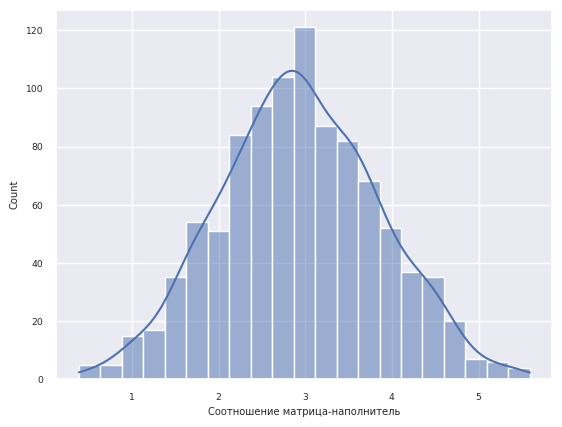

In [66]:
for target in [y_col_elasticity, y_col_strength, y_col_ratio]:
    print(f'Целевой признак {target}')
    print(f'Диапазон значений от {round(dataf[target].min(), 2)} до {round(dataf[target].max(), 2)}')
    sns.histplot(dataf[target], kde=True)
    plt.show()

## Нормализация данных

In [67]:
minmax = MinMaxScaler() 

In [68]:
# Модуль упругости при растяжении, ГПа
y_elasticity = dataf_without_outliners[y_col_elasticity]

In [69]:
# Прочность при растяжении, МПа
y_strength = dataf_without_outliners[y_col_strength]

In [70]:
# Соотношение матрица-наполнитель
y_ratio = dataf_without_outliners[y_col_ratio]

In [71]:
dataf_minmax = pd.DataFrame(minmax.fit_transform(dataf_without_outliners), columns=columns)

In [72]:
# Без преобразования категориальный тип
X_elasticity_norm = dataf_minmax.drop(y_col_elasticity, axis=1)
X_strength_norm = dataf_minmax.drop(y_col_strength, axis=1)
X_ratio_norm = dataf_minmax.drop(y_col_ratio, axis=1)

In [73]:
dataf_minmax.describe().T

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,899.0,0.488620,0.184443,0.0,0.363625,0.483725,0.615782,1.0
"Плотность, кг/м3",899.0,0.503927,0.187528,0.0,0.370404,0.512193,0.625558,1.0
"модуль упругости, ГПа",899.0,0.445177,0.199186,0.0,0.300813,0.442890,0.582506,1.0
"Количество отвердителя, м.%",899.0,0.513146,0.186664,0.0,0.384609,0.511668,0.647038,1.0
"Содержание эпоксидных групп,%_2",899.0,0.490339,0.182699,0.0,0.364123,0.486678,0.624540,1.0
"Температура вспышки, С_2",899.0,0.514064,0.193301,0.0,0.382344,0.513874,0.646790,1.0
"Поверхностная плотность, г/м2",899.0,0.373495,0.217386,0.0,0.206503,0.349615,0.538904,1.0
"Модуль упругости при растяжении, ГПа",899.0,0.487954,0.191801,0.0,0.358785,0.483236,0.615449,1.0
"Прочность при растяжении, МПа",899.0,0.497441,0.188454,0.0,0.367349,0.494500,0.615659,1.0
"Потребление смолы, г/м2",899.0,0.522464,0.195754,0.0,0.392535,0.518336,0.654237,1.0


## Функция тестирования моделей

Для автоматизации тестирования моделей напишу функции создания, тестирования моделей и вывода отчета

Импортируем необходимые библиотеки

In [74]:
from sklearn.linear_model import LinearRegression, Lasso, Ridge, SGDRegressor, ElasticNet, BayesianRidge
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.base import clone as clone_model
from sklearn.kernel_ridge import KernelRidge

from catboost import CatBoostRegressor
from xgboost.sklearn import XGBRegressor
from lightgbm import LGBMRegressor

Создадим модели машинного обучения и создададим словарь моделей. Модели будут инициализированы с параметрами по умолчанию.

In [76]:
# Линейная регрессия - Linear Regression
lr = LinearRegression()
# Стохастический градиентный спуск - Stochastic Gradient Descent Regressor
sdg = SGDRegressor()
# Лассо - Lasso
lasso = Lasso()
# Ридж-регрессия - Ridge
ridge = Ridge()
# Деревья решений - Decision Tree Regressor
dtr = DecisionTreeRegressor()
# Метод опорных векторов - Support Vector Regression
svr = SVR()
# К ближайших соседей - K Neighbors Regressor
knn = KNeighborsRegressor(n_neighbors=3)
# Градиентный бустинг - Gradient Boosting Regressor
gbr = GradientBoostingRegressor()
# Случайный лес - Random Forest Regressor
rfr = RandomForestRegressor()
# Многослойный перцептрон - Multi-layer Perceptron regressor
mlp = MLPRegressor()
# Эластичная сеть
elastic_net = ElasticNet(random_state=1234)
# Баесовская Ридж регрессия
bayesian_ridge = BayesianRidge()
# Регрессия гребня ядра
kernel_ridge = KernelRidge()
# CatBoostRegressor
cat = CatBoostRegressor(verbose=False)
# XGBRegressor
xgbr = XGBRegressor()
# LGBMRegressor
lgbr = LGBMRegressor()



ml_models_dict ={
    'Линейная регрессия - Linear Regression' : lr,
    'Лассо - Lasso' : lasso,
    'Ридж-регрессия' : ridge,
    'Стохастический градиентный спуск - Stochastic Gradient Descent Regressor' : sdg,
    'Деревья решений - Decision Tree Regressor' : dtr,
    'Метод опорных векторов - Support Vector Regression' : svr,
    'К ближайших соседей - K Neighbors Regressor' : knn,
    'Градиентный бустинг - Gradient Boosting Regressor' : gbr,
    'Случайный лес - Random Forest Regressor' : rfr,
    'Многослойный перцептрон - Multi-layer Perceptron regressor' : mlp,
    'Эластичная сеть' : elastic_net,
    'Баесовская Ридж регрессия' : bayesian_ridge,
    'Регрессия гребня ядра' : kernel_ridge,
    'CatBoostRegressor' : cat,
    'XGBRegressor' : xgbr,
    'LGBMRegressor' : lgbr
    }

Создадим функцию ыввода отчета

Для оценки моделей будут использованы следующие метрики
* $MAE$ Cредняя абсолютная ошибка представляет собой среднее значение абсолютной разницы между фактическими и прогнозируемыми значениями в наборе данных. Он измеряет среднее значение остатков в наборе данных.
* $MAPE$ Средняя абсолютная процентная ошибка - это средний процент ошибки прогнозных знаний
* $MSE$ Среднеквадратическая ошибка представляет собой среднее значение квадрата разницы между исходным и прогнозируемым значениями в наборе данных. Он измеряет дисперсию остатков.
* $RMSE$ Среднеквадратическая ошибка — это квадратный корень из средней квадратичной ошибки. Он измеряет стандартное отклонение остатков.
* $R^2$ Коэффициент детерминации или R-квадрат представляет долю дисперсии зависимой переменной, которая объясняется моделью линейной регрессии. Это безмасштабная оценка, т.е. независимо от того, малы или велики значения, значение R-квадрата будет меньше единицы.

In [77]:
def report_ml_model(model_name, y_test, y_pred, report= True, print_plot=False, safe_plot=False, normalization='', target_name='y'):
    # Метрики
    mae = mean_absolute_error(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred, squared=True)
    rmse = mean_squared_error(y_test, y_pred, squared=False)
    r2 = r2_score(y_test, y_pred)

    text = f"{model_name}:\nMAE:{mae}\nMAPE:{mape}\nMSE:{mse}\nRMSE:{rmse}\nR-Squared:{r2}\n{normalization}"
    if print_plot:
        fig = plt.figure(figsize=(8, 4))
        fig.text(0.0, 0.9, text)

        plt.plot(y_pred, label = "Предсказание", color = 'darkred')
        plt.plot(y_test, label = "Значение", color = 'limegreen')
        plt.xlabel("Количество наблюдений")
        plt.ylabel(target_name)

        plt.legend()
        plt.grid(True)      
        
        if safe_plot:
            path = "pic/model_" + str(namber) + ".png"
            fig.savefig(path)
    if report:
        return ([target_name, normalization, model_name, mae, mape, mse, rmse, r2]) #Целевой признак, Нормализация данных, Model, MAE, MAPE, MSE, RMSE ,R-Squared

Создадим функцию запуска и теста моделей

In [78]:
    
def run_test(x_train, x_test, y_train, y_test, ml_model, model_name, report=False, print_plot=False, normalization='', target_name=''):
    model = clone_model(ml_model)
    model.fit(x_train, y_train)
    y_pred = model.predict(x_test)
    report_list = report_ml_model(model_name, y_test, y_pred, report=report, print_plot=print_plot, normalization=normalization, target_name=target_name)
    if report:
        return report_list
    
def test_ml_model(data, y_column_name, ml_models_dict, report_list=False, random_state=1234, print_plot=False):  
    if not report_list:
        report_list = []
    
    scaler = StandardScaler()
    minmax = MinMaxScaler()
    
    data_std = pd.DataFrame(scaler.fit_transform(data), columns=data.columns)
    data_minmax = pd.DataFrame(minmax.fit_transform(data), columns=data.columns)
    
    x_train, x_test, y_train, y_test = train_test_split(np.array(data.loc[:,data.columns != y_column_name]), np.array(data[y_column_name]), test_size=0.3, random_state=random_state)
    x_train_std, x_test_std, y_train_std, y_test_std = train_test_split(np.array(data_std.loc[:,data.columns != y_column_name]), np.array(data_std[y_column_name]), test_size=0.3, random_state=random_state)
    x_train_minmax, x_test_minmax, y_train_minmax, y_test_minmax = train_test_split(np.array(data_minmax.loc[:,data.columns != y_column_name]), np.array(data_minmax[y_column_name]), test_size=0.3, random_state=random_state)
    
    for model_name, ml_model in ml_models_dict.items():
        report_list.append(run_test(x_train, x_test, y_train, y_test, ml_model, model_name, True, print_plot, 'Данные не нормализованы', target_name=y_column_name))
        report_list.append(run_test(x_train_std, x_test_std, y_train_std, y_test_std, ml_model, model_name, True, print_plot, 'StandardScaler', target_name=y_column_name))
        report_list.append(run_test(x_train_minmax, x_test_minmax, y_train_minmax, y_test_minmax, ml_model, model_name, True, print_plot, 'MinMaxScaler', target_name=y_column_name))
    return report_list

Для анализа метрик моделей данные будут выгружаться в список

In [79]:
report_list = []

## Тестирование моделей

Запустим тестирование моделей для целевых признаков 
* Модуль упругости при растяжении, ГПа  
Диапазон значений от 64.05 до 82.68

* Прочность при растяжении, МПа  
Диапазон значений от 1036.86 до 3848.44

In [80]:
report_list = test_ml_model(data=dataf_without_outliners, y_column_name=y_col_strength, ml_models_dict=ml_models_dict, report_list=report_list, random_state=1234, print_plot=False)

/home/sargon/miniconda3/envs/rapids/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/sargon/miniconda3/envs/rapids/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


In [81]:
report_list = test_ml_model(data=dataf_without_outliners, y_column_name=y_col_elasticity, ml_models_dict=ml_models_dict, report_list=report_list, random_state=1234, print_plot=False)

/home/sargon/miniconda3/envs/rapids/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/sargon/miniconda3/envs/rapids/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


In [82]:
report_df = pd.DataFrame(data=report_list, columns=['Целевой признак', 'Нормализация данных', 'Model', 'MAE', 'MAPE', 'MSE', 'RMSE' ,'R-Squared'], copy=True)

Рассмотрим результаты теста

In [83]:
@interact
def show_report_df(target=[y_col_elasticity, y_col_strength], sort_by=['MAE', 'MAPE', 'MSE', 'RMSE' ,'R-Squared'], ascending=[True, False]):
    return report_df.loc[report_df['Целевой признак'] == target].sort_values(by=sort_by, ascending=ascending).head(20)

interactive(children=(Dropdown(description='target', options=('Модуль упругости при растяжении, ГПа', 'Прочнос…

По обоим целевым признакам кофицеенты детерминации всех моделей отрицательные. Это означает что точность предсказаний моделей хуже предсказания среднего арифмитического целевого признака.


# Модуль упругости при растяжении, ГПа

In [84]:
x_train, x_test, y_train, y_test = train_test_split(np.array(dataf_minmax[X_col_elasticity]), np.array(dataf_minmax[y_col_elasticity]), test_size=0.3, random_state=1234)

Расмотрим предсказания лучшей по метрике MSE модели

### Байесовская гребенчатая регрессия

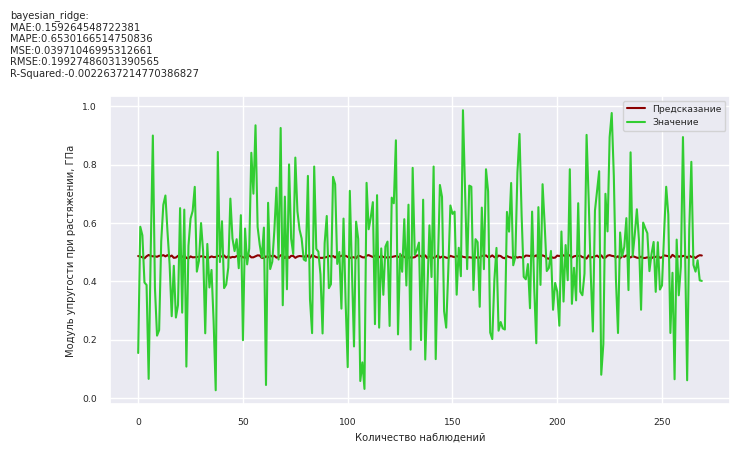

In [86]:
bayesian_ridge_param = {}
bayesian_ridge = BayesianRidge(**bayesian_ridge_param)
bayesian_ridge.fit(x_train, y_train)
report_ml_model('bayesian_ridge', y_test, bayesian_ridge.predict(x_test), report= False, print_plot=True, safe_plot=False, normalization='', target_name=y_col_elasticity)

График демонстрирует то что лучшая модель предсказывает значения близкие к среднему значению целевого признака.
Попробуем выполнить подбор гиперпараметров с перекрестной проверкой.

In [87]:
gridParams = {'alpha_init':[1, 1.1, 1.2, 1.3, 1.4, 1.5, 1.9],
                        'lambda_init': [1e-1, 1e-2, 1e-3, 1e-4, 1e-5, 1e-6, 1e-9]}

search = GridSearchCV(estimator=BayesianRidge(), param_grid = gridParams, scoring = 'neg_mean_squared_error',cv = 10, n_jobs=-1)
search.fit(x_train,y_train)

print(f'Лучшая модель {search.best_estimator_} {search.best_score_}')

Лучшая модель BayesianRidge(alpha_init=1.9, lambda_init=1e-09) -0.03568050926605019


Мы использовали тренировочный набор данных для поиска гиперпараметров. Проверим модел на тестовых данных

In [88]:
best_model = search.best_estimator_

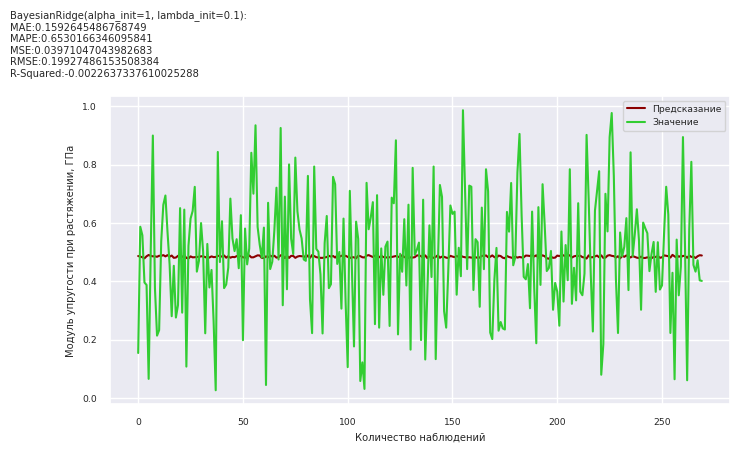

In [89]:
report_ml_model('BayesianRidge(alpha_init=1, lambda_init=0.1)', y_test, best_model.predict(x_test), report= False, print_plot=True, safe_plot=False, normalization='', target_name=y_col_elasticity)

Рассмотрим метод деревьевьев принятия решений с градиентным бустингом с помощью библиотек LightGBM и Scikit-learn

In [90]:
import lightgbm as lgb
import sklearn
print("Версия LightGBM      : ", lgb.__version__)
print("Версия Scikit-learn  : ", sklearn.__version__)

Версия LightGBM      :  3.3.5
Версия Scikit-learn  :  1.2.2


### LightGBM Regressor

Параметры модели LGBMRegressor

In [86]:
lgbmr = LGBMRegressor()
lgbmr.get_params()

{'boosting_type': 'gbdt',
 'class_weight': None,
 'colsample_bytree': 1.0,
 'importance_type': 'split',
 'learning_rate': 0.1,
 'max_depth': -1,
 'min_child_samples': 20,
 'min_child_weight': 0.001,
 'min_split_gain': 0.0,
 'n_estimators': 100,
 'n_jobs': -1,
 'num_leaves': 31,
 'objective': None,
 'random_state': None,
 'reg_alpha': 0.0,
 'reg_lambda': 0.0,
 'silent': 'warn',
 'subsample': 1.0,
 'subsample_for_bin': 200000,
 'subsample_freq': 0}

Запустим подбор гиперпараметров модели с перекрестной проверкой

In [87]:
gridParams = {
    'learning_rate': [0.005, 0.01,.1],
    'n_estimators': [50,100,150],
    'num_leaves': [4,6,7,8], 
    'boosting_type' : ['gbdt', 'dart'],
    'objective' : ['mean_absolute_error'],
    'max_bin':[127,255], 
    'colsample_bytree' : [.4,.6,.8],
    'subsample' : [.4,.6,.7,.8],
    'reg_alpha' : [0,.5,1],
    'reg_lambda' : [0,.5,1],
    }



search = GridSearchCV(estimator=lgbmr, param_grid = gridParams, scoring = 'neg_mean_squared_error',cv = 10, n_jobs=-1)
search.fit(x_train,y_train)

print(f'Лучшая модель {search.best_estimator_} {search.best_score_}')
best_model = search.best_estimator_

Лучшая модель LGBMRegressor(colsample_bytree=0.4, learning_rate=0.01, max_bin=255,
              num_leaves=6, objective='mean_absolute_error', reg_alpha=0,
              reg_lambda=0.5, subsample=0.4) -0.03616696459048334


Проверим на тестовых данных

In [148]:
best_model = LGBMRegressor(colsample_bytree=0.4, learning_rate=0.01, max_bin=255,
              num_leaves=6, objective='mean_absolute_error', reg_alpha=0,
              reg_lambda=0.5, subsample=0.4)
best_model.fit(x_train,y_train)

LGBMRegressor(colsample_bytree=0.4, learning_rate=0.01, max_bin=255,
              num_leaves=6, objective='mean_absolute_error', reg_alpha=0,
              reg_lambda=0.5, subsample=0.4)

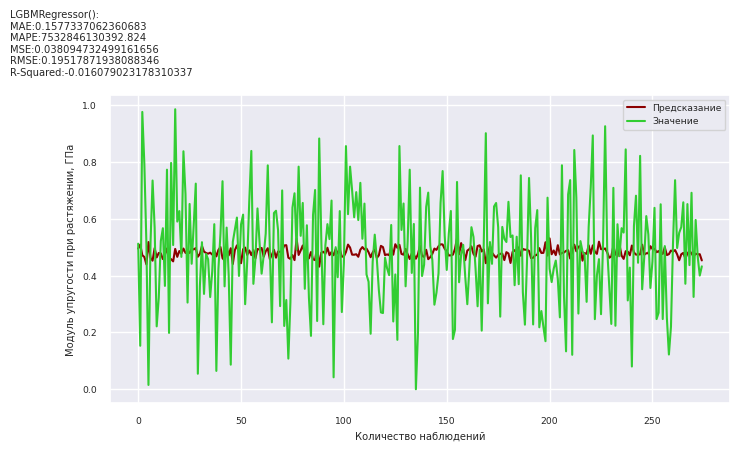

In [149]:
report_ml_model('LGBMRegressor()', y_test, best_model.predict(x_test), report= False, print_plot=True, safe_plot=False, normalization='', target_name=y_col_elasticity)

### GradientBoostingRegressor

Параметры модели GradientBoostingRegressor

In [91]:
gbr = GradientBoostingRegressor()
gbr.get_params()

{'alpha': 0.9,
 'ccp_alpha': 0.0,
 'criterion': 'friedman_mse',
 'init': None,
 'learning_rate': 0.1,
 'loss': 'squared_error',
 'max_depth': 3,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_iter_no_change': None,
 'random_state': None,
 'subsample': 1.0,
 'tol': 0.0001,
 'validation_fraction': 0.1,
 'verbose': 0,
 'warm_start': False}

Запустим подбор гиперпараметров модели с перекрестной проверкой

In [92]:
gridParams = {'n_estimators':[100,500], 
            'learning_rate': [0.1,0.05,0.02],
            'max_depth':[4], 
            'min_samples_leaf':[3], 
            'max_features':[1.0] } 
   
search = GridSearchCV(estimator=gbr, param_grid = gridParams, scoring = 'neg_mean_squared_error',cv = 10, n_jobs=-1)
search.fit(x_train,y_train)

print(f'Лучшая модель {search.best_estimator_} {search.best_score_}')

Лучшая модель GradientBoostingRegressor(learning_rate=0.02, max_depth=4, max_features=1.0,
                          min_samples_leaf=3) -0.03712431324210922


Проверим на тестовых данных

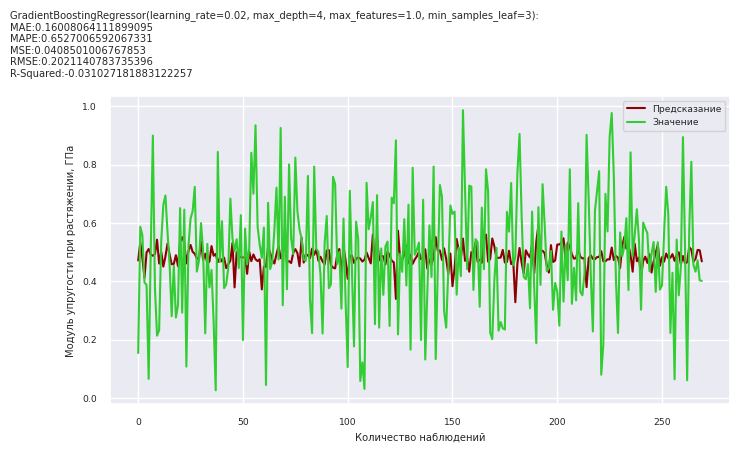

In [93]:
best_model = search.best_estimator_
report_ml_model('GradientBoostingRegressor(learning_rate=0.02, max_depth=4, max_features=1.0, min_samples_leaf=3)',
                y_test, best_model.predict(x_test), report= False, print_plot=True, safe_plot=False, normalization='', target_name=y_col_elasticity)

# Прочность при растяжении, МПа

In [94]:
x_train, x_test, y_train, y_test = train_test_split(np.array(dataf_minmax[X_col_strength]), np.array(dataf_minmax[y_col_strength]), test_size=0.3, random_state=1234)

Расмотрим предсказания лучшей по метрике MSE модель - ElasticNet()

### Эластичная сеть

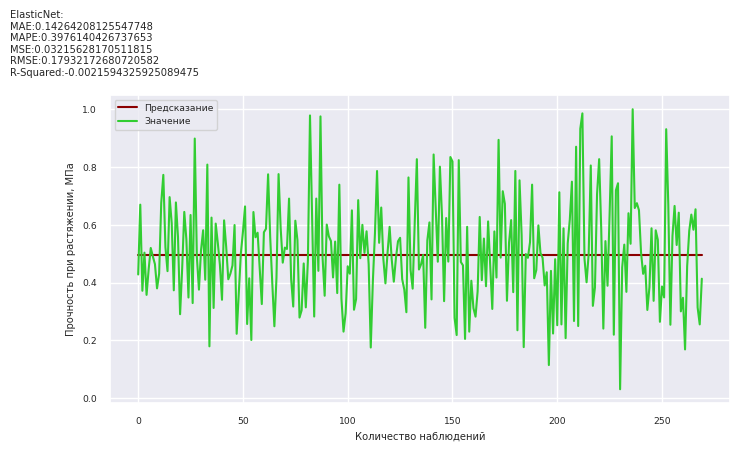

In [95]:
params = {}

elastic_net = ElasticNet(**params)
elastic_net.fit(x_train, y_train)
report_ml_model('ElasticNet', y_test, elastic_net.predict(x_test), report= False, print_plot=True, safe_plot=False, normalization='', target_name=y_col_strength)

Рассмотрим предсказания 'Прочность при растяжении, МПа' других моделей

### Линейная регрессия

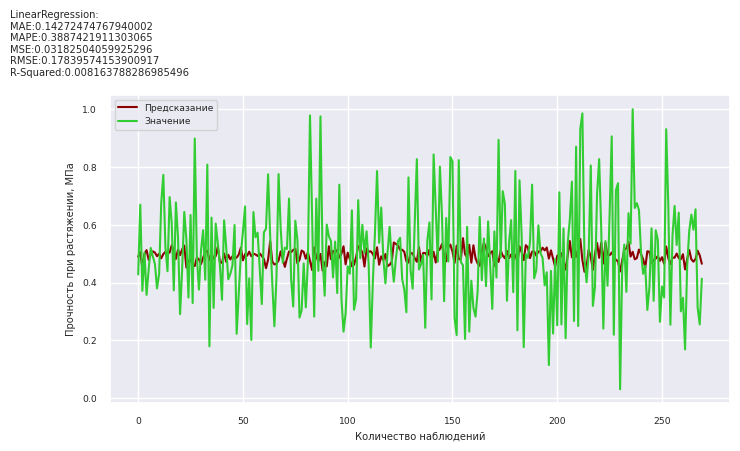

In [96]:
linear = LinearRegression()
linear.fit(x_train, y_train)

report_ml_model('LinearRegression', y_test, linear.predict(x_test), report= False, print_plot=True, safe_plot=False, normalization='', target_name=y_col_strength)

### Метод опорных векторов (регрессия)

Попробуем использовать метод опорных векторов с перекрестной проверкой

In [97]:
svr = SVR()
svr.get_params()

{'C': 1.0,
 'cache_size': 200,
 'coef0': 0.0,
 'degree': 3,
 'epsilon': 0.1,
 'gamma': 'scale',
 'kernel': 'rbf',
 'max_iter': -1,
 'shrinking': True,
 'tol': 0.001,
 'verbose': False}

In [98]:
cv_results = cross_validate(svr, x_train, y_train, cv = 3)
sorted(cv_results.keys())
cv_results['test_score']

array([-0.24401029, -0.36600524, -0.31057379])

Средннее значение на кросс вализации

In [99]:
np.mean(cv_results['test_score'])

-0.30686310913254444

Обучим модель и проверим кофицент детерминации не тесте

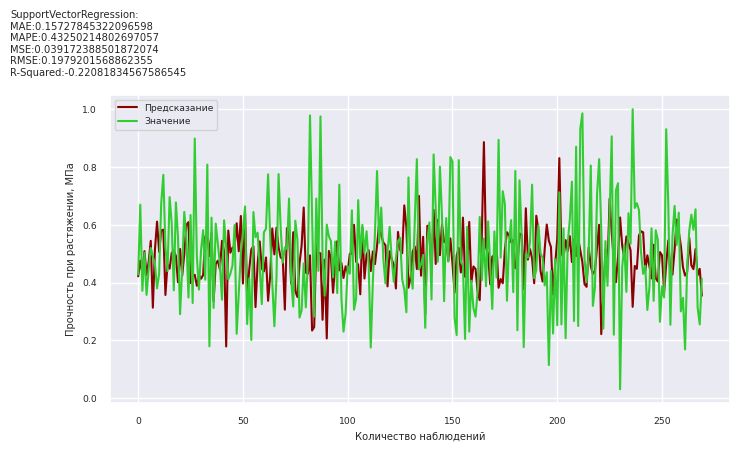

In [100]:
svr.fit(x_train, y_train)
report_ml_model('SupportVectorRegression', y_test, svr.predict(x_test), report= False, print_plot=True, safe_plot=False, normalization='', target_name=y_col_strength)

Попробуем использовать CatBoostRegressor и XGBRegressor

In [101]:
import catboost
import xgboost
print("Версия CatBoost : ", catboost.__version__)
print("Версия XGBoost  : ", xgboost.__version__)

Версия CatBoost :  1.1.1
Версия XGBoost  :  1.7.1


### CatBoostRegressor

In [102]:
cat1params = {'learning_rate': 0.08,
              'depth' : 3,
              'l2_leaf_reg' : 2.0,
              'custom_metric' : ['RMSE'], #'R2', 'MAE'],
              'random_seed' : 1234,

              'verbose' : False,
              'task_type' :'GPU'}

cat1 = CatBoostRegressor(**cat1params)

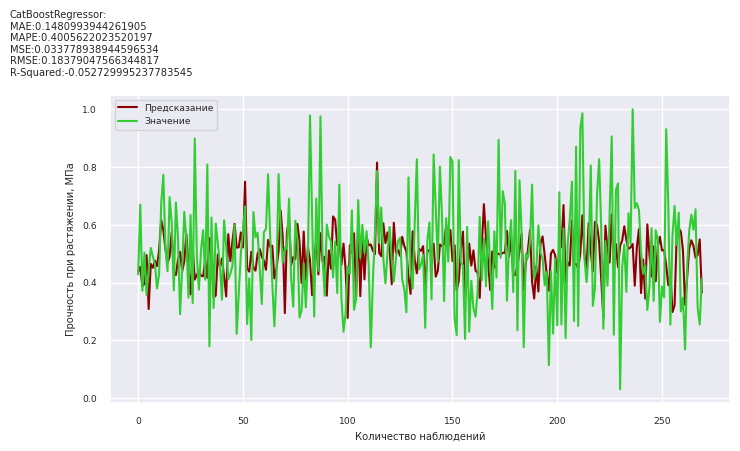

In [103]:
cat1.fit(x_train,
         y_train)
report_ml_model('CatBoostRegressor', y_test, cat1.predict(x_test), report= False, print_plot=True, safe_plot=False, normalization='', target_name=y_col_strength)

### XGBRegressor

In [104]:
xgbr = XGBRegressor()
xgbr.get_params()

{'objective': 'reg:squarederror',
 'base_score': None,
 'booster': None,
 'callbacks': None,
 'colsample_bylevel': None,
 'colsample_bynode': None,
 'colsample_bytree': None,
 'early_stopping_rounds': None,
 'enable_categorical': False,
 'eval_metric': None,
 'feature_types': None,
 'gamma': None,
 'gpu_id': None,
 'grow_policy': None,
 'importance_type': None,
 'interaction_constraints': None,
 'learning_rate': None,
 'max_bin': None,
 'max_cat_threshold': None,
 'max_cat_to_onehot': None,
 'max_delta_step': None,
 'max_depth': None,
 'max_leaves': None,
 'min_child_weight': None,
 'missing': nan,
 'monotone_constraints': None,
 'n_estimators': 100,
 'n_jobs': None,
 'num_parallel_tree': None,
 'predictor': None,
 'random_state': None,
 'reg_alpha': None,
 'reg_lambda': None,
 'sampling_method': None,
 'scale_pos_weight': None,
 'subsample': None,
 'tree_method': None,
 'validate_parameters': None,
 'verbosity': None}

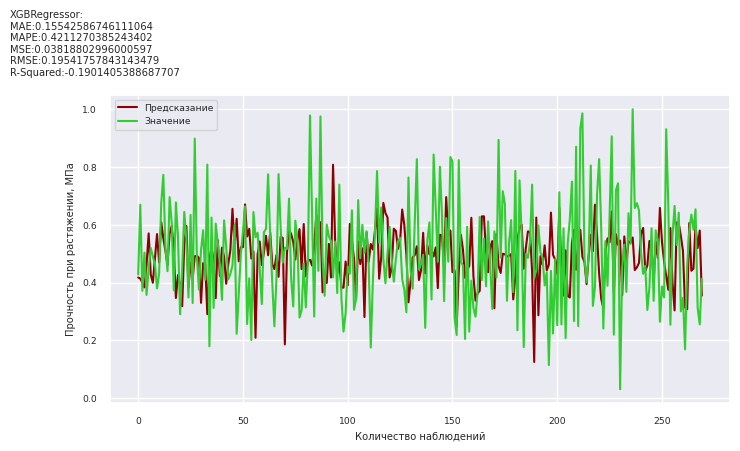

In [105]:
xgbr.fit(x_train, y_train)

report_ml_model('XGBRegressor', y_test, xgbr.predict(x_test), report= False, print_plot=True, safe_plot=False, normalization='', target_name=y_col_strength)

## Нееросеть

In [106]:
import keras
from keras import Sequential, layers,backend
from keras.layers import Dense, Input
from keras.utils import plot_model 

Для прогнозирования целевого признака 'Соотношение матрица-наполнитель' создадим нееросеть

In [107]:
# Создаем модель
r_model = Sequential(name="ratio_model")

# Добовляем слои
# r_model.add(r_normalizer)


r_model.add(Dense(12, input_dim=12, activation="relu"))
r_model.add(Dense(24, activation="relu"))
r_model.add(Dense(24, activation="relu"))

r_model.add(Dense(1))

# Компилируем модель
r_model.compile(
    loss="MeanAbsoluteError", optimizer="Adamax", metrics=["MeanAbsoluteError"]
)

r_model.summary()

Model: "ratio_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 12)                156       
                                                                 
 dense_1 (Dense)             (None, 24)                312       
                                                                 
 dense_2 (Dense)             (None, 24)                600       
                                                                 
 dense_3 (Dense)             (None, 1)                 25        
                                                                 
Total params: 1,093
Trainable params: 1,093
Non-trainable params: 0
_________________________________________________________________


2023-04-19 15:23:50.344750: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:982] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-04-19 15:23:50.345653: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:982] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-04-19 15:23:50.345724: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:982] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-04-19 15:23:50.348716: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:982] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-04-19 15:23:50.348827: I tensorflow/compile

Разбиваем данные на тренировочную и тестовую выборки

In [108]:
x_train, x_test, y_train, y_test = train_test_split(np.array(dataf_minmax[X_col_ratio]), np.array(dataf_minmax[y_col_ratio]), test_size=0.3, random_state=1234)

Тренируем модель

In [109]:
history = r_model.fit(x_train, y_train, epochs=100, verbose=1, validation_split=0.1)

Epoch 1/100


2023-04-19 15:23:55.458815: I tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:637] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.
2023-04-19 15:23:55.466841: I tensorflow/compiler/xla/service/service.cc:169] XLA service 0x7f6dfc792a20 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2023-04-19 15:23:55.466905: I tensorflow/compiler/xla/service/service.cc:177]   StreamExecutor device (0): NVIDIA GeForce RTX 3060 Laptop GPU, Compute Capability 8.6
2023-04-19 15:23:55.492694: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2023-04-19 15:23:55.778178: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:424] Loaded cuDNN version 8600
2023-04-19 15:23:56.023489: I ./tensorflow/compiler/jit/device_compiler.h:180] Compiled cluster using XLA!  This line is logged at most once for the lifeti

18/18 [==============================] - 4s 13ms/step - loss: 0.5300 - mean_absolute_error: 0.5300 - val_loss: 0.3945 - val_mean_absolute_error: 0.3945
Epoch 2/100
18/18 [==============================] - 0s 6ms/step - loss: 0.2461 - mean_absolute_error: 0.2461 - val_loss: 0.2008 - val_mean_absolute_error: 0.2008
Epoch 3/100
18/18 [==============================] - 0s 7ms/step - loss: 0.1756 - mean_absolute_error: 0.1756 - val_loss: 0.1765 - val_mean_absolute_error: 0.1765
Epoch 4/100
18/18 [==============================] - 0s 6ms/step - loss: 0.1687 - mean_absolute_error: 0.1687 - val_loss: 0.1783 - val_mean_absolute_error: 0.1783
Epoch 5/100
18/18 [==============================] - 0s 6ms/step - loss: 0.1631 - mean_absolute_error: 0.1631 - val_loss: 0.1731 - val_mean_absolute_error: 0.1731
Epoch 6/100
18/18 [==============================] - 0s 7ms/step - loss: 0.1606 - mean_absolute_error: 0.1606 - val_loss: 0.1704 - val_mean_absolute_error: 0.1704
Epoch 7/100
18/18 [==============

Для визуализации создам функцию

In [110]:
def plot_loss(history, metrics, x_lim=False):
    fig = plt.figure()
    ax1 = fig.add_subplot(211)
    ax1.plot(history.history["loss"], label="loss")
    ax1.plot(history.history["val_loss"], label="val_loss")
    ax1.set_ylabel("loss")
    if x_lim:
        ax1.set_xlim(x_lim)
    ax1.legend()
    ax1.grid(True)
    ax1 = fig.add_subplot(212)
    ax1.plot(history.history[metrics], label=metrics)
    ax1.plot(history.history["val_" + str(metrics)], label="val_" + str(metrics))
    ax1.set_xlabel("Эпоха")
    ax1.set_ylabel("metrics")
    if x_lim:
        ax1.set_xlim(x_lim)
    plt.legend()
    plt.grid(True)

    # Эпоха с минимальным значением метрики
    min_metric_epoch = pd.DataFrame(history.history).iloc[:, 3].idxmin()
    # Минимальное значение метрики
    min_metric_value = pd.DataFrame(history.history).iloc[:, 3].min()

    print(
        f"Эпоха с минимальным значением метрики - {min_metric_epoch} \nМинимальное значение метрики - {min_metric_value}"
    )

Визуализируем процесс обучения и результат прогноза модели

9/9 [==============================] - 0s 2ms/step
R2 test:-0.041736520372751995
Эпоха с минимальным значением метрики - 75 
Минимальное значение метрики - 0.15255610644817352
9/9 [==============================] - 0s 2ms/step


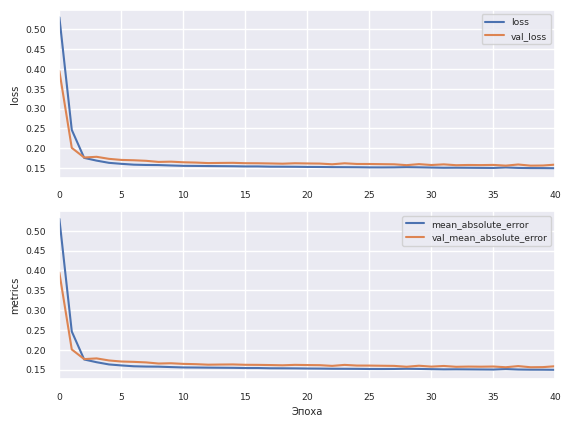

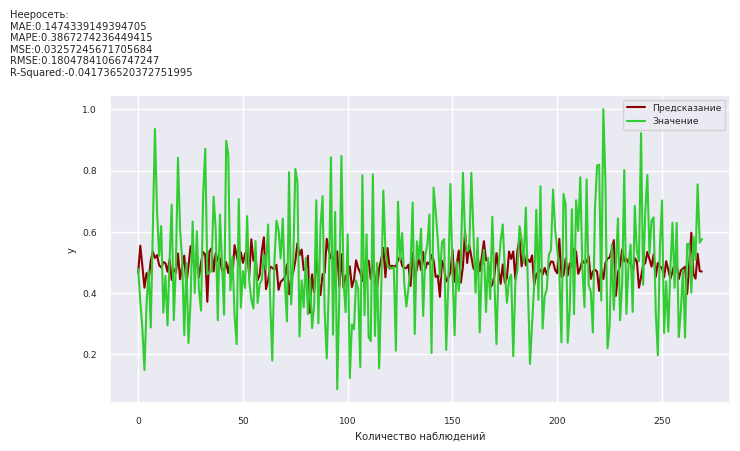

In [111]:
print(f'R2 test:{r2_score(y_test, r_model.predict(x_test))}')
plot_loss(history, "mean_absolute_error", x_lim=[0, 40])
report_ml_model('Нееросеть', y_test, r_model.predict(x_test), report= False, print_plot=True, safe_plot=False, normalization='', target_name='y')

Модель обучается, но кофицент детерминации отрицательный

В keras нет встроеной метрики детерминации отрицательный, создадим свою

In [112]:
def r2(y_true, y_pred):
    SS_res = backend.sum(backend.square( y_true-y_pred ))
    SS_tot = backend.sum(backend.square( y_true - backend.mean(y_true) ) )
    return ( 1 - SS_res/(SS_tot + backend.epsilon()) )


Попробуем постоить модель с ФА elu

In [113]:
def model_build_11(x_train, x_test, y_train, y_test):
    backend.clear_session() 
    model = Sequential(name="ratio_model")

    # Добовляем слои
    # r_model.add(r_normalizer)
    model.add(Input(shape=(x_train.shape[1],)))
    
    model.add(Dense(24, activation="elu"))
    model.add(Dense(48, activation="elu"))

    model.add(Dense(1))
    # Компилируем модель

    model.compile(loss="MeanSquaredError", optimizer="Adam", metrics=r2)
    return model

In [114]:
model_1 = model_build_11(x_train, x_test, y_train, y_test)

In [115]:
history_1 = model_1.fit(x_train, y_train, epochs=100, verbose=0, validation_split=0.1)

9/9 [==============================] - 0s 2ms/step
R2 test:-0.01631960534990684
Эпоха с минимальным значением метрики - 0 
Минимальное значение метрики - -0.8035436868667603
9/9 [==============================] - 0s 1ms/step


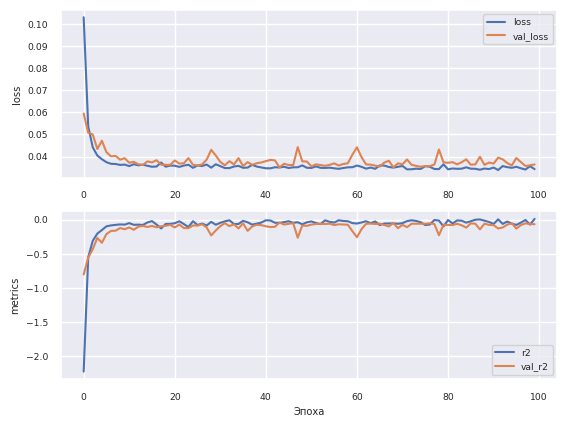

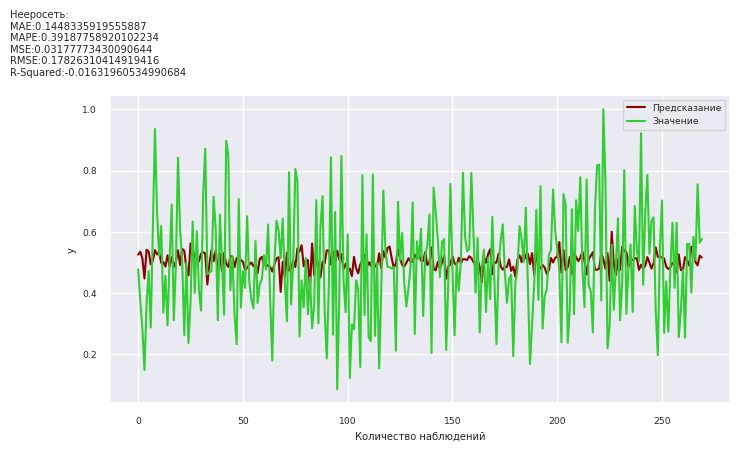

In [116]:
print(f'R2 test:{r2_score(y_test, model_1.predict(x_test))}')
plot_loss(history_1, "r2")
report_ml_model('Нееросеть', y_test, model_1.predict(x_test), report= False, print_plot=True, safe_plot=False, normalization='', target_name='y')

In [117]:
pd.DataFrame(history_1.history).sort_values('val_r2', ascending=False)

,loss,r2,val_loss,val_r2
43,0.035016,-0.048429,0.035047,-0.042535
68,0.034962,-0.055559,0.035073,-0.049806
31,0.034745,-0.025023,0.035995,-0.051719
46,0.035085,-0.046797,0.036081,-0.053015
94,0.034860,-0.060339,0.035940,-0.053145
...,...,...,...,...
3,0.040448,-0.205231,0.043419,-0.268813
4,0.038764,-0.153575,0.047173,-0.338844
2,0.044148,-0.310744,0.049986,-0.433965
1,0.053602,-0.552316,0.050772,-0.555659


Для теста различных параметров создам класс тестировщик

optimizer
* SGD – стохастический градиентный спуск (с моментами, в том числе и Нестерова);
* RMSprop – оптимизатор RMSprop;
* Adam – оптимизатор Adam;
* Adadelta – оптимизатор Adadelta;
* Adagrad – оптимизатор Adagrad.

Loss
* BinaryCrossentropy – бинарная кросс-энтропия;
* CategoricalCrossentropy – категориальная кросс-энтропия;
* KLDivergence – дивергенция Кульбака-Лейблера;
* MeanSquaredError – средний квадрат ошибки;
* MeanAbsoluteError – средняя абсолютная ошибка.

Активационные функции
* elu Экспоненциальный линейный блок keras.activations.elu(x, alpha=1.0)
* softmax Функция активации Softmax keras.activations.softmax(x, axis=-1)
* selu Масштабируемая экспоненциальная линейная единица (SELU) keras.activations.selu(x)
* softplus Функция активации Softplus keras.activations.softplus(x)
* softsign Функция активации softsignkeras.activations.softsign(x)
* relu Спрямленный линейный блок keras.activations.relu(x, alpha=0.0, max_value=None, threshold=0.0)
* tanh Функция активации гиперболического тангенса keras.activations.tanh(x)
* sigmoid Функция активации сигмоида keras.activations.sigmoid(x)
* hard_sigmoid Функция активации жествкая сигмоида keras.activations.hard_sigmoid(x)
* linear Функция линейной (т.е. идентификационная) активации keras.activations.linear(x)

##### Шаблон словаря отчета
{'Кол-во скрытых слоев' :  len(hidden_layers),
 'loss' :  loss,
 'optimizer' :  optimizer,
 'metrics' :  metrics,
 'Результат' : results,
 'min_metric_epoch' = min_metric_epoch
 'min_metric_value' = min_metric_value
 }

In [118]:
# Функция конструктор
# X = x_test
# y = y_test
# количество слоёв = amount_layers
# количество нейронов = N
def build_moedel_(X, y, amount_layers, N, activation, loss, optimizer, metric):
    # Создаем модель
    model = Sequential(name="Ratio_model")

    # Добовляем слои

    # Входной слой
    model.add(Input(shape=(X.shape[1],)))

    # Скрытые слои
    for layer in range(amount_layers):
        model.add(Dense(N, activation=activation))
        model.add(Dropout(0.05))

    # Выходной слой
    model.add(Dense(1, activation="linear"))

    # Компилируем модель
    model.compile(loss=loss, optimizer=optimizer, metrics=[metric])

    return model

In [119]:
# Функция запуска обучения модели
# X = x_test
# y = y_test
def run_model_(model, X, y, epochs=40, verbose=0, validation_split=0.2):
    history = model.fit(
        X, y, epochs=epochs, verbose=verbose, validation_split=validation_split
    )
    return history

In [120]:
# Функция теста модели
def test_model_(model, x_test, y_test, batch_size=128, verbose=0):
    return model.evaluate(x_test, y_test, batch_size=batch_size, verbose=verbose)

In [121]:
# функция печати отчета
def report_(
    history,
    amount_layers,
    N,
    loss,
    optimizer,
    metrics,
    namber,
    x_lim=False,
    y_lim=False,
    print_plot=False,

    ):
    # Эпоха с минимальным значением метрики
    min_metric_epoch = pd.DataFrame(history.history).iloc[:, 3].idxmin()
    # Минимальное значение метрики
    min_metric_value = pd.DataFrame(history.history).iloc[:, 3].min()
    # Эпоха с максимальным значением метрики
    max_metric_epoch = pd.DataFrame(history.history).iloc[:, 3].idxmax()
    # Максимальное значение метрики
    max_metric_value = pd.DataFrame(history.history).iloc[:, 3].max()
    
    
    text = "-" * 80
    text += f"\nМодель №:{namber}\n"
    text += f"Скрытых слоёв: {amount_layers} по {N} нейронов\nФункция ошибки:{loss}\nОптимизатор : {optimizer},\nМетрика : {metrics}\n"
    text += f"Эпоха с минимальным значением метрики - {min_metric_epoch} Максимальным - {max_metric_epoch}\n"
    text += f"Минимальное значение метрики - {min_metric_value} Максимальное - {max_metric_value}\n"

    if metrics == "MeanAbsoluteError":
        metrics = "mean_absolute_error"
    elif metrics == "MeanSquaredError":
        metrics = "mean_squared_error"

    if print_plot:
       
        metrics = list(history.history.keys())
        half = len(list(history.history.keys())) / 2
        half = int(half)

        fig = plt.figure(figsize=(8, 2.5*half))
        fig.text(0.0, 0.9, f"{text}")
        for i in range(int(half)):

            ax = fig.add_subplot(half*100 + 10 + i+1)
            ax.plot(history.history[metrics[i]], label=metrics[i])
            ax.plot(history.history[metrics[i+half]], label=metrics[i+half])
            ax.set_ylabel(metrics[i])
            ax.set_xlabel("Эпоха")
            ax.legend()      
        
            if x_lim:
                ax.set_xlim(x_lim)
            if y_lim:
                ax.set_ylim(y_lim)
                
        plt.legend()
        plt.grid(True)
        path = "pic/model_" + str(namber) + ".png"
        fig.savefig(path)

    return min_metric_epoch, min_metric_value

In [122]:
# Класс метрика R2
class Coeff_determination:
    def __call__(self, y_true, y_pred):
        SS_res = backend.sum(backend.square( y_true-y_pred ))
        SS_tot = backend.sum(backend.square( y_true - backend.mean(y_true) ) )
        return ( 1 - SS_res/(SS_tot + backend.epsilon()) )
    def __str__(self):
        return 'coeff_determination'

coeff_determination = Coeff_determination()

In [123]:
# Тест одной модели с выводом отчета
def test_model(
    x_train,
    y_train,
    x_test,
    y_test,
    namber=0,
    amount_layers=2,
    N=8,
    activation="relu",
    loss="MeanAbsoluteError",
    optimizer="Adam",
    metric=coeff_determination,
    epochs = 40
    ):
    
    with open("report.txt", "w") as file:
        model = build_moedel_(
            x_train, y_train, amount_layers, N, activation, loss, optimizer, metric
        )
        history = run_model_(
            model, x_train, y_train, epochs=epochs, verbose=0, validation_split=0.2
        )
        result = test_model_(model, x_test, y_test)
        report_(
            history,
            amount_layers,
            N,
            loss,
            optimizer,
            metric,
            namber,
            x_lim = False,
            print_plot = True
            )
        
        report_ml_model(str('Модель №' + str(namber)), y_test, model.predict(x_test), report= False, print_plot=True, safe_plot=False, normalization='', target_name='y')


In [124]:
# Запуск теста

9/9 [==============================] - 0s 2ms/step


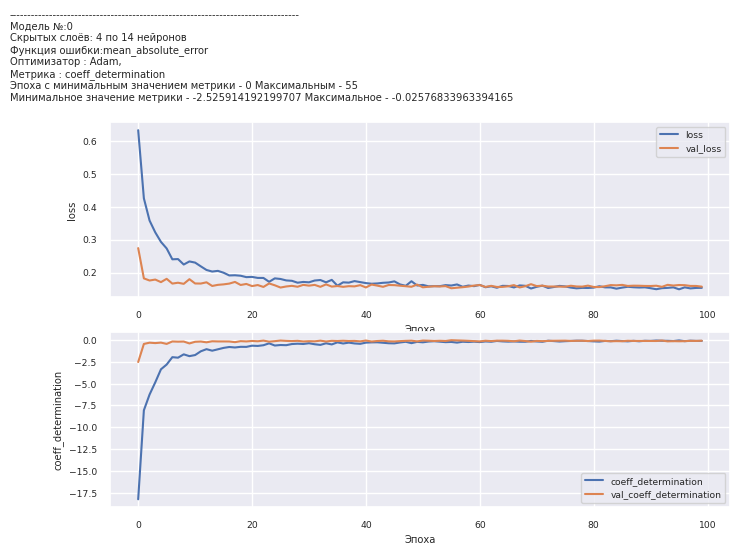

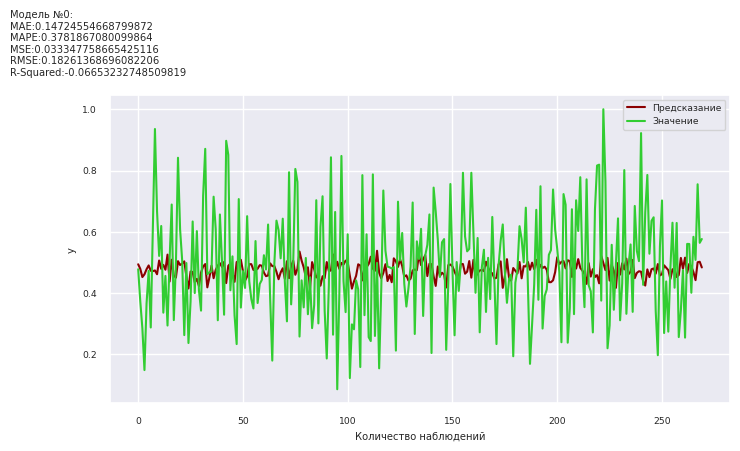

In [125]:
test_model(
    x_train,
    y_train,
    x_test,
    y_test,
    namber=0,
    amount_layers=4,
    N=14,
    activation="selu",
    loss="mean_absolute_error",
    optimizer="Adam",
    epochs = 100
)

In [126]:
import os

In [127]:
# Основная функция эксперементатора
class Enumeration_of_models:
    report_column = [
        "Номер",
        "Кол-во слоев",
        "Кол-во нейронов",
        "activation",
        "loss",
        "optimizer",
        "metric",
        "Эпоха лучшего результата валидации",
        "Лучший результат валидации",
        "Результат теста 1",
        "Результат теста 2",
    ]

    def __init__(self, log=False):
        if not log:
            self.log = []
        else:
            self.log = log

    def clear_log(self):
        self.log = []

    def load_csv(self):
        report = pd.read_csv("Enumeration_of_models_log.scv")
        self.log.extend(report.values.tolist())
        
    def read_csv(self):
        return pd.DataFrame(self.log, columns=self.report_column)

    def save_csv(self):
        csv = pd.DataFrame(self.log, index=False, columns=self.report_column)
        csv.to_csv(r"Enumeration_of_models_log.scv")

    def fit(
        self,
        x_train,
        y_train,
        x_test,
        y_test,
        layers_iter,
        N_iter,
        epochs=5,
        min_layers=1,
        max_layers=1,
        min_N=1,
        max_N=1,
        activations=None,
        losses=None,
        optimizers=None,
        metrics=None,
        print_pic=False,
        namber=1,
        min_loss=False,
    ):
        if not activations:
            activations = [
                "elu",
                "softmax",
                "selu",
                "softplus",
                "softsign",
                "relu",
                "tanh",
                "sigmoid",
                "hard_sigmoid",
                "linear",
            ]
        if not losses:
            losses = [
                "mean_squared_error",
                "mean_absolute_error",
                "mean_absolute_percentage_error",
                "mean_squared_logarithmic_error",
                "squared_hinge",
                "hinge",
                "categorical_hinge",
                "logcosh",
            ]
        if not optimizers:
            optimizers = [
                "SGD",
                "RMSprop",
                "Adam",
                "Adadelta",
                "Adagrad",
                "Adamax",
                "Nadam",
                "Ftrl",
            ]  # optimizers AdamW Adafactor
        if not metrics:
            metrics = ["mean_absolute_error"]
        if not min_loss:
            min_loss = 99999999999
        best_model = "Нет удовлетворяющей минимумальной ошибке модели"

        #data_report = []

        # max_layers += 1
        # max_N += 1

        print("-" * 8)
        print(
            f"Всего шагов {len(layers_iter) * len(N_iter) * len(activations) * len(losses) * len(optimizers) * len(metrics)}"
        )
        print("-" * 8)

        with open("report.txt", "a") as file:
            for metric in metrics:
                for optimizer in optimizers:
                    for loss in losses:
                        for activation in activations:
                            for layers in layers_iter:
                                for N in N_iter:
                                    print(
                                        f"Шаг {namber} {metric=} {optimizer=} {loss=} {activation=} {layers=} {N=}"
                                    )
                                    
                                    # Создание модели

                                    model = build_moedel_(
                                        x_train,
                                        y_train,
                                        layers,
                                        N,
                                        activation,
                                        loss,
                                        optimizer,
                                        metric,
                                    )
                                    # Тренировка модели
                                    
                                    history = run_model_(
                                        model,
                                        x_train,
                                        y_train,
                                        epochs=epochs,
                                        verbose=0,
                                        validation_split=0.2,
                                    )
                                    
                                    # Тестирование модели
                                    
                                    result = test_model_(model, x_test, y_test)
                                    print(f"Результат теста loss={result[0]} metric={result[1]}")
                                    
                                    # report and loss
                                    
                                    min_metric_epoch, min_metric_value = report_(
                                        history,
                                        layers,
                                        N,
                                        loss,
                                        optimizer,
                                        metric,
                                        namber,
                                        x_lim=False,
                                        print_plot = print_pic
                                    )
                                    
                                    # 
                                    if print_pic:
                                        report_ml_model(str('Модель №' + str(namber)), y_test, model.predict(x_test), report= False, print_plot=True, safe_plot=False, normalization='', target_name='y')

                                    self.log.append(
                                        [
                                            namber,
                                            layers,
                                            N,
                                            activation,
                                            loss,
                                            optimizer,
                                            metric,
                                            min_metric_epoch,
                                            min_metric_value,
                                            result[0],
                                            result[1],
                                        ]
                                    )

                                    if result[1] < min_loss:
                                        min_loss = result[1]
                                        best_model = str(
                                            f"\n\n\n\n\n\nМодель №{namber} {metric=} {optimizer=} {loss=} {activation=} {layers=} {N=} {epochs=}\nЛучший результат{min_loss}\n"
                                        )

                                    namber += 1

                                    ## Удаляем все
                                    del model
                                    del history
                                    del result
                                    backend.clear_session()
                                    
            ##Запись в файл лучшего результата
            file.write(best_model)
        print(best_model)

Протестируем различные активационные функции, функции ошибки и оптимизаторы

In [128]:
# Создали экземпляр
enumeration_of_models = Enumeration_of_models()

In [130]:
#Для загрузки отчета
enumeration_of_models.load_csv()

In [101]:
# TEST
layers = [2]
N = [12]

activations = ["softmax",
                "selu",
                "softplus",
                "relu",
                "tanh",
                "sigmoid",
                "linear"]
losses = ["mean_squared_error",
                "mean_absolute_error",
                "logcosh"]
optimizers = ["SGD",
                "RMSprop",
                "Adam",
                "Adadelta",
                "Adagrad",
                "Adamax",
                "Nadam"]
metrics = [coeff_determination]
experement_nomber = 0
print_pic = False


enumeration_of_models.fit(
    x_train,
    y_train,
    x_test,
    y_test,
    layers_iter=layers,
    N_iter=N,
    activations=activations,
    losses=losses,
    optimizers=optimizers,
    metrics=metrics,
    print_pic=print_pic,
    namber=experement_nomber,
)

--------
Всего шагов 147
--------
Шаг 0 metric=<__main__.Coeff_determination object at 0x7fea23e13850> optimizer='SGD' loss='mean_squared_error' activation='softmax' layers=2 N=12
Результат теста loss=0.041337061673402786 metric=-0.22312147915363312
Шаг 1 metric=<__main__.Coeff_determination object at 0x7fea23e13850> optimizer='SGD' loss='mean_squared_error' activation='selu' layers=2 N=12
Результат теста loss=0.07026614248752594 metric=-1.1265283823013306
Шаг 2 metric=<__main__.Coeff_determination object at 0x7fea23e13850> optimizer='SGD' loss='mean_squared_error' activation='softplus' layers=2 N=12
Результат теста loss=0.03915631026029587 metric=-0.15603236854076385
Шаг 3 metric=<__main__.Coeff_determination object at 0x7fea23e13850> optimizer='SGD' loss='mean_squared_error' activation='relu' layers=2 N=12
Результат теста loss=0.04441021755337715 metric=-0.4078080654144287
Шаг 4 metric=<__main__.Coeff_determination object at 0x7fea23e13850> optimizer='SGD' loss='mean_squared_error' a

In [152]:
report = pd.DataFrame(enumeration_of_models.log)

In [154]:
report = report.iloc[:,1:]

In [156]:
report.columns=enumeration_of_models.report_column

Рассмотрим полученый отчет

In [157]:
report

,Номер,Кол-во слоев,Кол-во нейронов,activation,loss,optimizer,metric,Эпоха лучшего результата валидации,Лучший результат валидации,Результат теста 1,Результат теста 2
0,0,2,12,softmax,mean_squared_error,SGD,coeff_determination,0,-2.434584,0.041337,-0.223121
1,1,2,12,selu,mean_squared_error,SGD,coeff_determination,0,-2.084638,0.070266,-1.126528
2,2,2,12,softplus,mean_squared_error,SGD,coeff_determination,0,-0.171192,0.039156,-0.156032
3,3,2,12,relu,mean_squared_error,SGD,coeff_determination,0,-0.409292,0.044410,-0.407808
4,4,2,12,tanh,mean_squared_error,SGD,coeff_determination,0,-1.310042,0.056236,-0.823773
...,...,...,...,...,...,...,...,...,...,...,...
142,142,2,12,softplus,logcosh,Nadam,coeff_determination,4,-0.039710,0.017467,-0.049602
143,143,2,12,relu,logcosh,Nadam,coeff_determination,0,-5.031507,0.022695,-0.327637
144,144,2,12,tanh,logcosh,Nadam,coeff_determination,0,-0.532869,0.023008,-0.520076
145,145,2,12,sigmoid,logcosh,Nadam,coeff_determination,0,-14.774290,0.035547,-1.182926


Сохраним полученый отчет в файл

In [141]:
report.to_csv(r"Enumeration_of_models_log.scv")

In [158]:
report.nunique()

Номер                                 147
Кол-во слоев                            1
Кол-во нейронов                         1
activation                              7
loss                                    3
optimizer                               7
metric                                  1
Эпоха лучшего результата валидации      5
Лучший результат валидации            147
Результат теста 1                     147
Результат теста 2                     147
dtype: int64

In [159]:
report.sort_values("Результат теста 2", ascending=False).head(10)

,Номер,Кол-во слоев,Кол-во нейронов,activation,loss,optimizer,metric,Эпоха лучшего результата валидации,Лучший результат валидации,Результат теста 1,Результат теста 2
44,44,2,12,softplus,mean_squared_error,Adam,coeff_determination,0,-0.090679,0.033435,0.028012
12,12,2,12,sigmoid,mean_absolute_error,SGD,coeff_determination,0,-0.057390,0.150443,0.012752
37,37,2,12,softplus,logcosh,RMSprop,coeff_determination,0,-0.027132,0.016363,0.003307
5,5,2,12,sigmoid,mean_squared_error,SGD,coeff_determination,4,-0.034647,0.033646,-0.007532
7,7,2,12,softmax,mean_absolute_error,SGD,coeff_determination,0,-1.559043,0.150905,-0.008240
33,33,2,12,sigmoid,mean_absolute_error,RMSprop,coeff_determination,0,-9.246580,0.151178,-0.014877
58,58,2,12,softplus,logcosh,Adam,coeff_determination,0,-7.377822,0.017988,-0.019175
19,19,2,12,sigmoid,logcosh,SGD,coeff_determination,0,-1.796948,0.016936,-0.021389
26,26,2,12,sigmoid,mean_squared_error,RMSprop,coeff_determination,0,-0.119875,0.033931,-0.022168
138,138,2,12,sigmoid,mean_absolute_error,Nadam,coeff_determination,0,-0.113763,0.151996,-0.022491


In [227]:
x_train, x_test, y_train, y_test = train_test_split(np.array(dataf_minmax[X_col_ratio]), np.array(dataf_without_outliners[y_col_ratio]), test_size=0.3, random_state=1234)

In [252]:
# Создаем модель
model_3 = Sequential(name="ratio_model_3")

model_3.add(Input(shape=12, name='input'))

model_3.add(Dense(12, activation="softplus", name='Dense_1'))
model_3.add(Dense(12, activation="softplus", name='Dense_2'))

model_3.add(Dense(1, name='output'))

# Компилируем модель
model_3.compile(
    loss="mean_squared_error", optimizer="Adam", metrics='mean_absolute_error'
)

model_3.summary()

Model: "ratio_model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Dense_1 (Dense)             (None, 12)                156       
                                                                 
 Dense_2 (Dense)             (None, 12)                156       
                                                                 
 output (Dense)              (None, 1)                 13        
                                                                 
Total params: 325
Trainable params: 325
Non-trainable params: 0
_________________________________________________________________


In [253]:
history_3 = model_3.fit(x_train, y_train, epochs=30, verbose=0, validation_split=0.1)

9/9 [==============================] - 0s 1ms/step


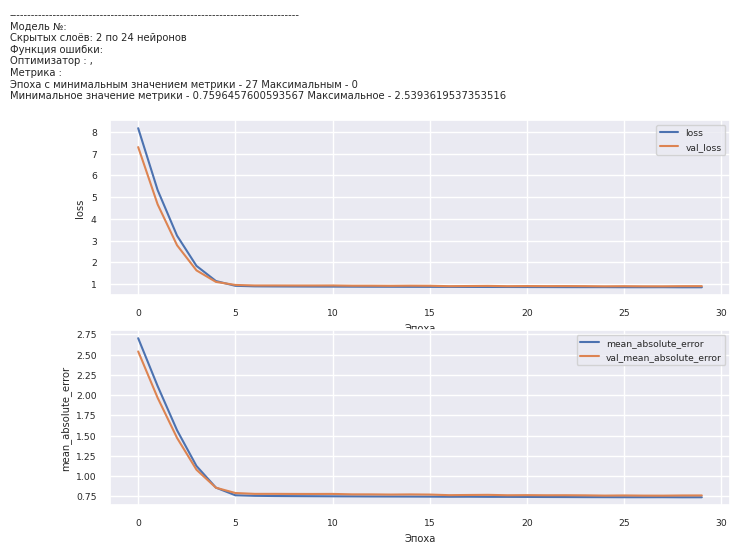

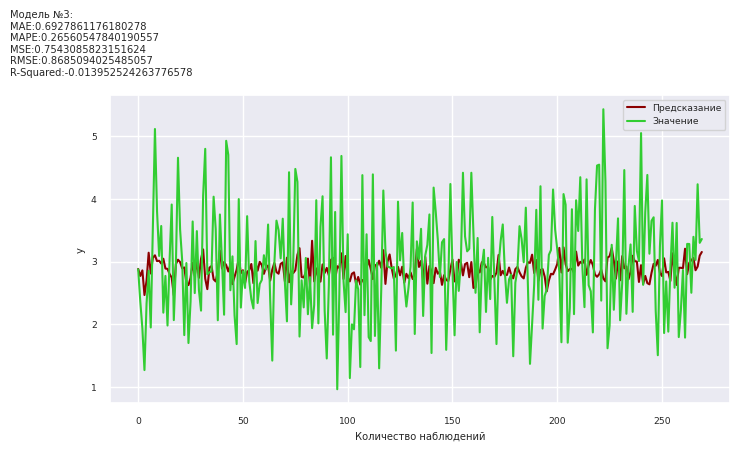

In [254]:
report_(history_3, print_plot = True, amount_layers=2, N=24, loss='', optimizer='', metrics='', namber='')
report_ml_model(str('Модель №3'), y_test, model_3.predict(x_test), report= False, print_plot=True, safe_plot=False, normalization='', target_name='y')

In [255]:
history_3 = model_3.fit(x_train, y_train, epochs=30, verbose=0, validation_split=0.1)

9/9 [==============================] - 0s 2ms/step


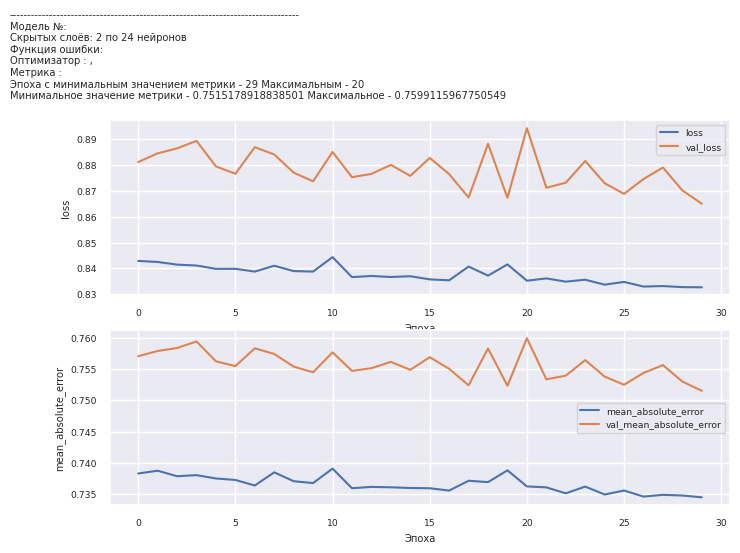

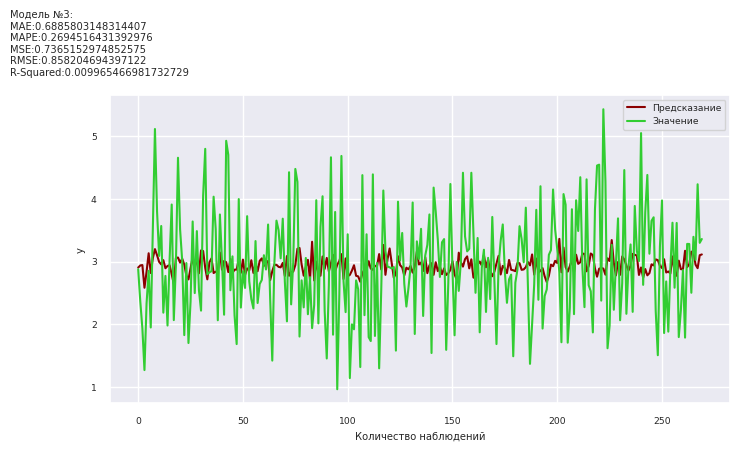

In [256]:
report_(history_3, print_plot = True, amount_layers=2, N=24, loss='', optimizer='', metrics='', namber='')
report_ml_model(str('Модель №3'), y_test, model_3.predict(x_test), report= False, print_plot=True, safe_plot=False, normalization='', target_name='y')

Сохраним модель для приложения

In [257]:
model_3.save('app/model')

INFO:tensorflow:Assets written to: app/model/assets


In [258]:
import pickle

In [259]:
pickle.dump(minmax, open('app/minmax.pkl', 'wb'))

In [260]:
load_model = keras.models.load_model('app/model')

In [267]:
test = [2.465205,1936.099137,1056.554985,71.294058,24.523381,271.975678,129.077163,6.420794,2868.586527,227.022557,0.000000,7.401543,19.250533]
test = pd.DataFrame([test], columns=columns)

In [262]:
load_model = keras.models.load_model('app/model')

minmax = pickle.load(open('app/minmax.pkl', 'rb'))

In [269]:
test_norm = minmax.transform(test)

In [278]:
test_norm[0, 1:].reshape(1,12)

(1, 12)

In [279]:
pred = load_model.predict(test_norm[0, 1:].reshape(1,12))
print('!!!!!!!!!!!!!!!!!!!!' ,pred)

1/1 [==============================] - 0s 51ms/step
!!!!!!!!!!!!!!!!!!!! [[3.397287]]


In [275]:
x_test.shape

(270, 12)

In [280]:
columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки'],
      dtype='object')